In [ ]:
# Step 1: Install Hugging Face Transformers
!pip install -q transformers

# Step 2: Import the DETR model
from transformers import DetrModel

# Step 3: Load pretrained DETR with ResNet-50 backbone
model = DetrModel.from_pretrained("facebook/detr-resnet-50")

# Step 4: Print the expected encoder input dimension
print("Transformer encoder expects dimension:", model.config.d_model)


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pas

Transformer encoder expects dimension: 256


In [ ]:
import torch

In [ ]:
x = torch.arange(1*1*2*3).view(1, 1, 2, 3)
# x = shape [1, 1, 2, 3]
# Values:
# [[[[0, 1, 2],
#     [3, 4, 5]]]]

x_flat = x.flatten(2)  # → shape: [1, 1, 6]
# Result:
# [[[[0, 1, 2, 3, 4, 5]]]]


In [ ]:
print (x)
print (x_flat)

tensor([[[[0, 1, 2],
          [3, 4, 5]]]])
tensor([[[0, 1, 2, 3, 4, 5]]])


In [ ]:
import torch
import torch.nn as nn

# Input tensor of shape: [batch_size=1, in_channels=3, height=2, width=2]
x = torch.tensor([[[[1.0, 2.0],
                    [3.0, 4.0]],

                   [[5.0, 6.0],
                    [7.0, 8.0]],

                   [[9.0, 10.0],
                    [11.0, 12.0]]]])  # shape: [1, 3, 2, 2]

# Define a 1x1 convolution: input channels=3, output channels=2
conv = nn.Conv2d(in_channels=3, out_channels=2, kernel_size=1, bias=False)

# Manually set weights for transparency
# Shape: [out_channels, in_channels, 1, 1]
conv.weight.data = torch.tensor([[[[1.0]], [[0.0]], [[-1.0]]],   # Output channel 0: x0 - x2
                                 [[[0.0]], [[1.0]], [[1.0]]]])   # Output channel 1: x1 + x2

# Apply the convolution
output = conv(x)

print("Input shape :", x.shape)
print("Output shape:", output.shape)
print("Output tensor:\n", output)


Input shape : torch.Size([1, 3, 2, 2])
Output shape: torch.Size([1, 2, 2, 2])
Output tensor:
 tensor([[[[-8., -8.],
          [-8., -8.]],

         [[14., 16.],
          [18., 20.]]]], grad_fn=<ConvolutionBackward0>)


Mounted at /content/drive


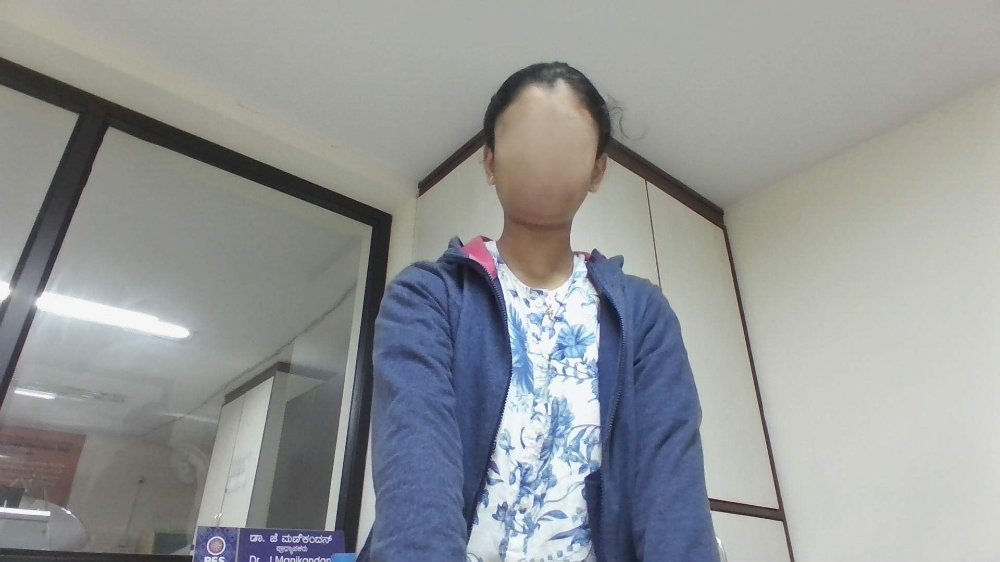

Original image size: (1920, 1080)
Input shape after resize: torch.Size([1, 3, 64, 64])
Output shape: torch.Size([1, 1, 64, 64])


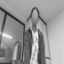

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from PIL import Image
from google.colab import drive
from IPython.display import display


#  Mount Google Drive
drive.mount('/content/drive')

#  Load image from your Drive (edit the path to your image)
image_path = '/content/drive/MyDrive/peddet_2_1.jpg'  # <-- CHANGE THIS
image = Image.open(image_path).convert('RGB')
display(image)

print("Original image size:", image.size)



# Preprocess
transform = transforms.Compose([
    transforms.Resize((64, 64)),
    transforms.ToTensor(),
])

x = transform(image).unsqueeze(0)
print("Input shape after resize:", x.shape)

# Define 1x1 convolution
conv = nn.Conv2d(in_channels=3, out_channels=1, kernel_size=1, bias=False)
with torch.no_grad():
    conv.weight.copy_(torch.tensor([[[[0.299]], [[0.587]], [[0.114]]]]))  # grayscale weights

# Apply convolution
output = conv(x)
print("Output shape:", output.shape)

# Convert output to image and display
to_pil = transforms.ToPILImage()
output_image = to_pil(output.squeeze(0))
display(output_image)


convolution

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image

from google.colab import drive
from IPython.display import display




In [ ]:
#  Mount Google Drive
drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# 1. Load image
img_path = '/content/drive/MyDrive/peddet_2_1.jpg'
img = Image.open(img_path).convert('RGB')


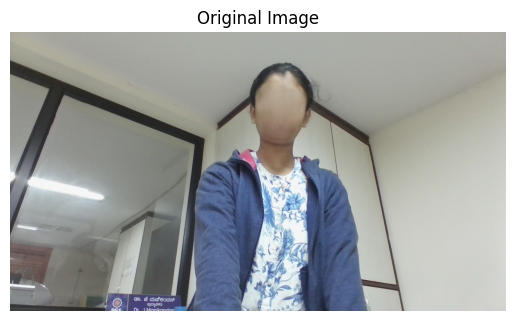

Input image tensor shape: torch.Size([1, 3, 128, 128])


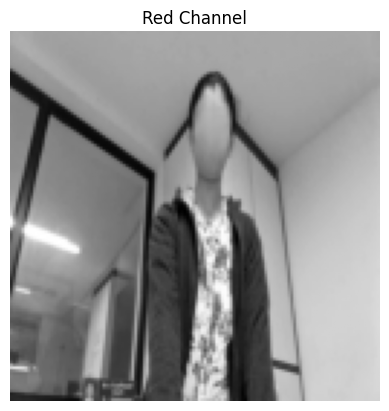

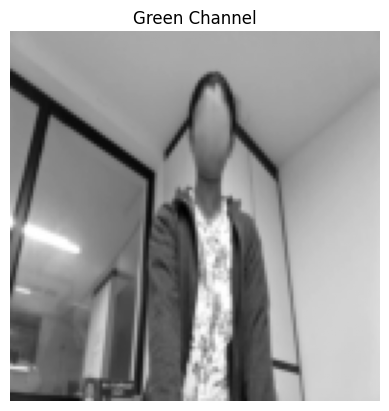

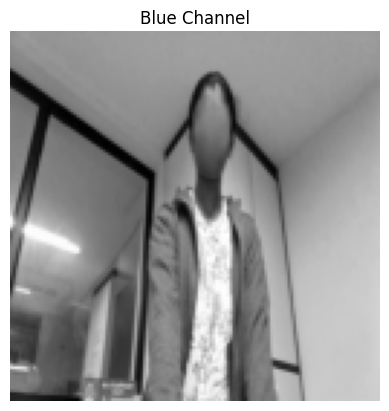

After 1×1 conv, output shape: torch.Size([1, 8, 128, 128])


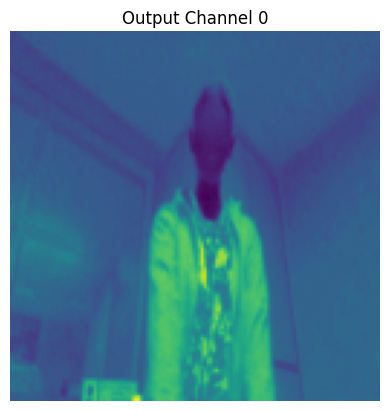

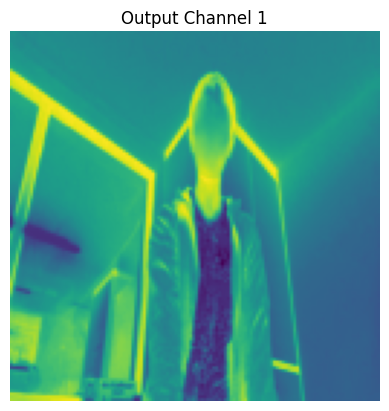

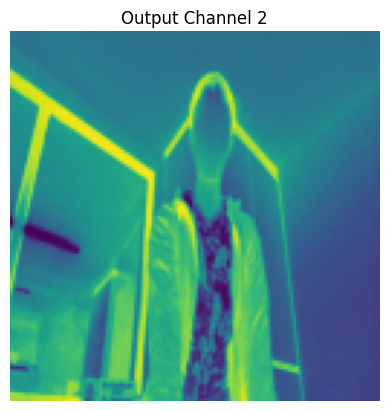

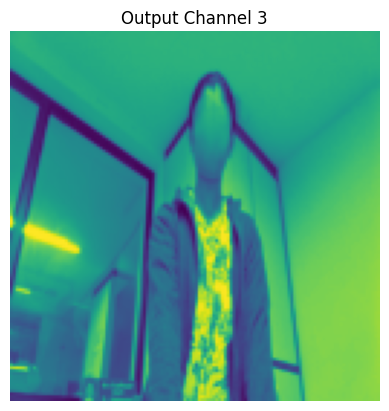

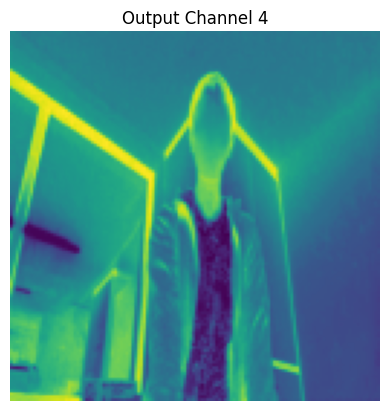

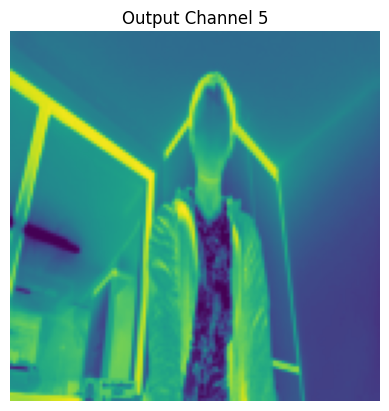

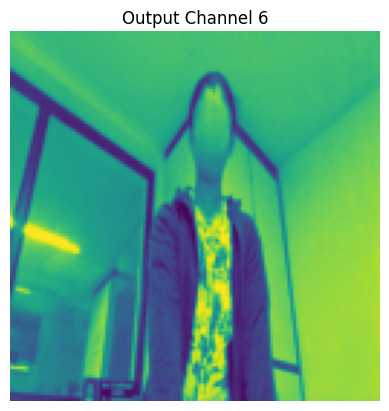

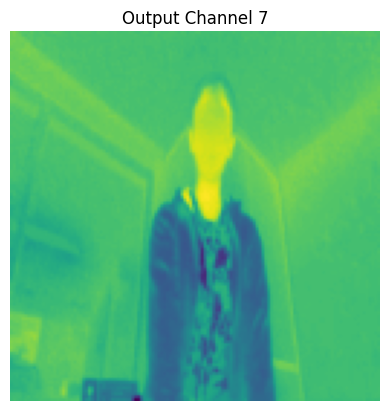

In [ ]:
# 2. Print original image
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')
plt.show()

# 3. Transform image → Tensor
transform = T.Compose([
    T.Resize((128, 128)),  # Smaller size for visualization
    T.ToTensor()  # → [C, H, W], float32, range [0,1]
])
img_tensor = transform(img).unsqueeze(0)  # → [1, 3, 128, 128]
print(f"Input image tensor shape: {img_tensor.shape}")

# 4. Print each RGB channel as a grayscale image
channels = ['Red', 'Green', 'Blue']
for i in range(3):
    plt.imshow(img_tensor[0, i].detach().cpu(), cmap='gray')
    plt.title(f"{channels[i]} Channel")
    plt.axis('off')
    plt.show()

# 5. Define 1×1 convolution: 3 → 8 channels (for display)
conv1x1 = nn.Conv2d(in_channels=3, out_channels=8, kernel_size=1)
output = conv1x1(img_tensor)

print(f"After 1×1 conv, output shape: {output.shape}")  # → [1, 8, 128, 128]

# 6. Plot output channels
for i in range(output.shape[1]):
    plt.imshow(output[0, i].detach().cpu(), cmap='viridis')
    plt.title(f"Output Channel {i}")
    plt.axis('off')
    plt.show()

In [ ]:
print("1x1 Convolution Weights (8 output channels, 3 input channels each):\n")

for i in range(conv1x1.out_channels):
    weight_vector = conv1x1.weight[i].view(-1)  # [3] → 1x1 kernel flattened
    print(f"Filter {i}: [R, G, B] weights = {weight_vector.tolist()}")


1x1 Convolution Weights (8 output channels, 3 input channels each):

Filter 0: [R, G, B] weights = [-0.20313037931919098, -0.19003508985042572, 0.425681471824646]
Filter 1: [R, G, B] weights = [0.38156914710998535, -0.40196192264556885, -0.38698798418045044]
Filter 2: [R, G, B] weights = [-0.5613402724266052, 0.39855408668518066, -0.34218043088912964]
Filter 3: [R, G, B] weights = [0.4897202253341675, 0.2592323422431946, 0.40242815017700195]
Filter 4: [R, G, B] weights = [-0.12204132974147797, 0.32615751028060913, -0.5039752125740051]
Filter 5: [R, G, B] weights = [-0.13473550975322723, -0.5373126864433289, -0.5020867586135864]
Filter 6: [R, G, B] weights = [0.004653224255889654, 0.5230843424797058, -0.2354840189218521]
Filter 7: [R, G, B] weights = [0.4426657557487488, 0.07915374636650085, -0.5413612723350525]


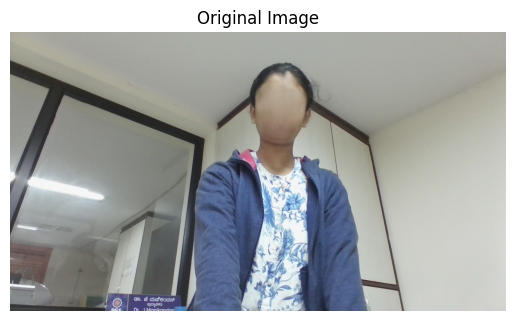

Original image size (width, height): (1920, 1080)
Input image tensor shape: torch.Size([1, 3, 1080, 1920])


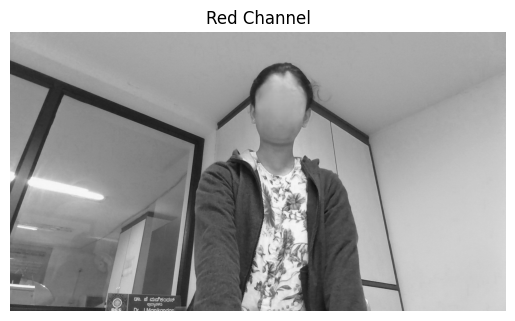

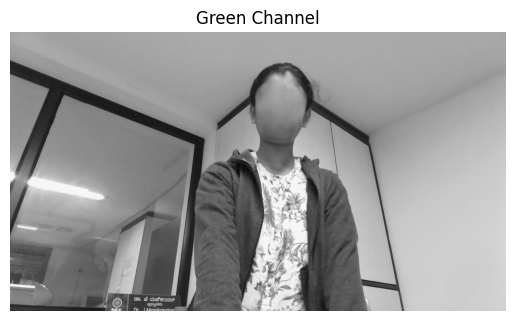

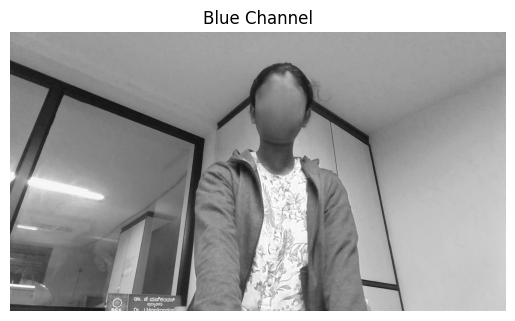

After 1×1 conv, output shape: torch.Size([1, 2, 1080, 1920])


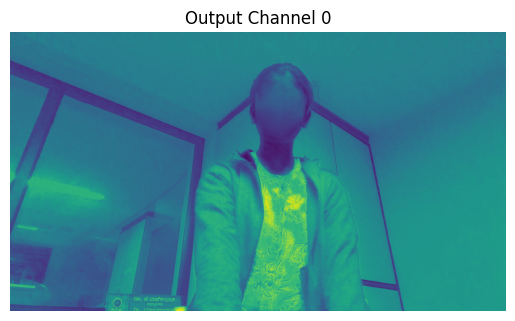

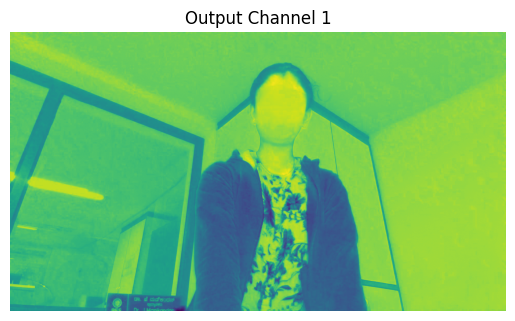


1×1 Convolution Weights (2 output filters, each with 3 weights):

Filter 0: [R, G, B] weights = [-0.48704972863197327, 0.20756831765174866, 0.5391889214515686]
Filter 1: [R, G, B] weights = [0.4564815163612366, 0.2168181985616684, -0.48459556698799133]

Bias terms:
Bias 0: 0.48359042406082153
Bias 1: -0.385224312543869


In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image

# 1. Load image
img_path = '/content/drive/MyDrive/peddet_2_1.jpg'
img = Image.open(img_path).convert('RGB')

# 2. Print original image
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')
plt.show()
print(f"Original image size (width, height): {img.size}")


# 3. Transform image → Tensor
transform = T.Compose([

    T.ToTensor()           # [C, H, W], values in [0,1]
])
img_tensor = transform(img).unsqueeze(0)  # [1, 3, 128, 128]
print(f"Input image tensor shape: {img_tensor.shape}")

# 4. Show individual RGB channels as grayscale
channels = ['Red', 'Green', 'Blue']
for i in range(3):
    plt.imshow(img_tensor[0, i], cmap='gray')
    plt.title(f"{channels[i]} Channel")
    plt.axis('off')
    plt.show()

# 5. Define 1×1 convolution: 3 input → 2 output channels
conv1x1 = nn.Conv2d(in_channels=3, out_channels=2, kernel_size=1)
output = conv1x1(img_tensor)
print(f"After 1×1 conv, output shape: {output.shape}")  # [1, 2, 128, 128]

# 6. Plot both output channels
for i in range(output.shape[1]):
    plt.imshow(output[0, i].detach(), cmap='viridis')
    plt.title(f"Output Channel {i}")
    plt.axis('off')
    plt.show()

# 7. Print weights for both filters
print("\n1×1 Convolution Weights (2 output filters, each with 3 weights):\n")
for i in range(conv1x1.out_channels):
    weights = conv1x1.weight[i].view(-1)
    print(f"Filter {i}: [R, G, B] weights = {weights.tolist()}")

# 8. Print biases
print("\nBias terms:")
for i in range(conv1x1.out_channels):
    print(f"Bias {i}: {conv1x1.bias[i].item()}")


with the tensor values :

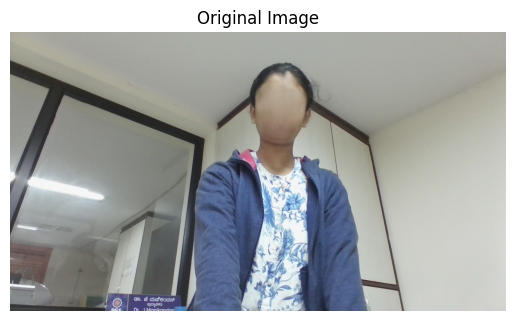

Original image size (width, height): (1920, 1080)

Original image pixel values (H, W, C):
[[[162 163 149]
  [164 165 151]
  [168 166 153]
  ...
  [166 169 152]
  [165 169 155]
  [164 168 154]]

 [[163 164 150]
  [165 166 150]
  [167 168 154]
  ...
  [167 169 155]
  [166 170 156]
  [166 170 156]]

 [[164 167 150]
  [165 168 149]
  [166 169 152]
  ...
  [167 169 156]
  [167 170 159]
  [167 170 159]]

 ...

 [[ 58  59  63]
  [ 58  59  63]
  [ 59  60  62]
  ...
  [208 208 208]
  [208 208 208]
  [208 208 208]]

 [[ 58  59  63]
  [ 58  59  63]
  [ 59  60  62]
  ...
  [209 209 209]
  [209 209 209]
  [209 209 209]]

 [[ 57  58  62]
  [ 58  59  63]
  [ 58  59  61]
  ...
  [209 209 209]
  [209 209 209]
  [210 210 210]]]
Sample pixel at (0,0): [162 163 149]
Input image tensor shape: torch.Size([1, 3, 1080, 1920])
Input Image Tensor Values:
 tensor([[[[0.6353, 0.6431, 0.6588,  ..., 0.6510, 0.6471, 0.6431],
          [0.6392, 0.6471, 0.6549,  ..., 0.6549, 0.6510, 0.6510],
          [0.6431, 0.6471,

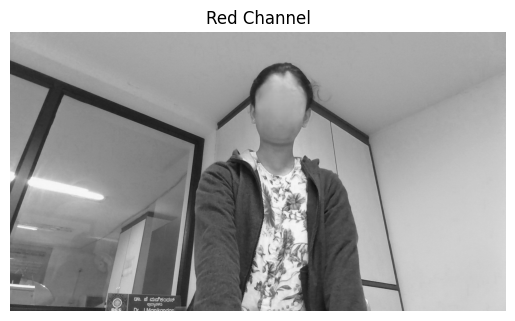

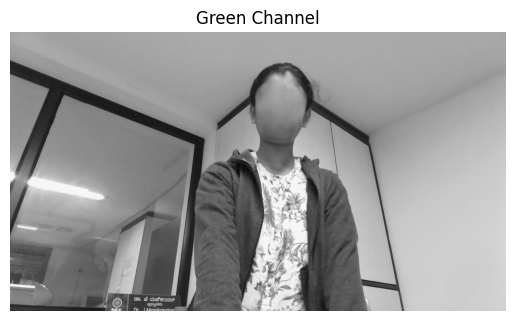

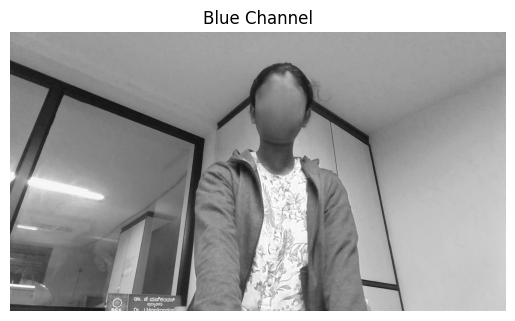

Red Channel Shape: torch.Size([1080, 1920])
Red Channel Values:
tensor([[0.6353, 0.6431, 0.6588,  ..., 0.6510, 0.6471, 0.6431],
        [0.6392, 0.6471, 0.6549,  ..., 0.6549, 0.6510, 0.6510],
        [0.6431, 0.6471, 0.6510,  ..., 0.6549, 0.6549, 0.6549],
        ...,
        [0.2275, 0.2275, 0.2314,  ..., 0.8157, 0.8157, 0.8157],
        [0.2275, 0.2275, 0.2314,  ..., 0.8196, 0.8196, 0.8196],
        [0.2235, 0.2275, 0.2275,  ..., 0.8196, 0.8196, 0.8235]])
Green Channel Shape: torch.Size([1080, 1920])
Green Channel Values:
tensor([[0.6392, 0.6471, 0.6510,  ..., 0.6627, 0.6627, 0.6588],
        [0.6431, 0.6510, 0.6588,  ..., 0.6627, 0.6667, 0.6667],
        [0.6549, 0.6588, 0.6627,  ..., 0.6627, 0.6667, 0.6667],
        ...,
        [0.2314, 0.2314, 0.2353,  ..., 0.8157, 0.8157, 0.8157],
        [0.2314, 0.2314, 0.2353,  ..., 0.8196, 0.8196, 0.8196],
        [0.2275, 0.2314, 0.2314,  ..., 0.8196, 0.8196, 0.8235]])
Blue Channel Shape: torch.Size([1080, 1920])
Blue Channel Values:
tensor

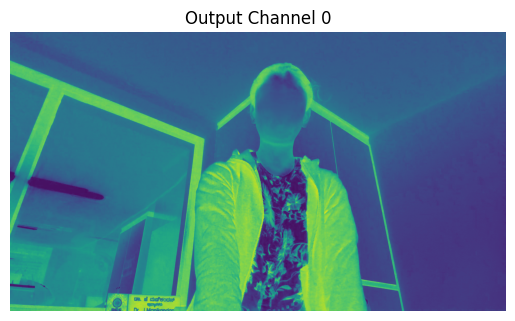

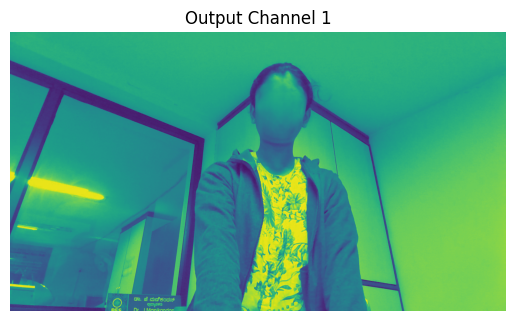

Convolution Output Tensor Shape: torch.Size([1, 2, 1080, 1920])
Convolution Output Tensor Values:
 tensor([[[[0.1429, 0.1406, 0.1398,  ..., 0.1329, 0.1368, 0.1379],
          [0.1418, 0.1370, 0.1371,  ..., 0.1362, 0.1356, 0.1356],
          [0.1352, 0.1316, 0.1329,  ..., 0.1374, 0.1390, 0.1390],
          ...,
          [0.2858, 0.2858, 0.2822,  ..., 0.1073, 0.1073, 0.1073],
          [0.2858, 0.2858, 0.2822,  ..., 0.1061, 0.1061, 0.1061],
          [0.2869, 0.2858, 0.2834,  ..., 0.1061, 0.1061, 0.1050]],

         [[0.4668, 0.4750, 0.4819,  ..., 0.4850, 0.4905, 0.4865],
          [0.4709, 0.4752, 0.4873,  ..., 0.4911, 0.4946, 0.4946],
          [0.4768, 0.4770, 0.4850,  ..., 0.4931, 0.5008, 0.5008],
          ...,
          [0.0756, 0.0756, 0.0758,  ..., 0.6787, 0.6787, 0.6787],
          [0.0756, 0.0756, 0.0758,  ..., 0.6828, 0.6828, 0.6828],
          [0.0715, 0.0756, 0.0717,  ..., 0.6828, 0.6828, 0.6869]]]],
       grad_fn=<ConvolutionBackward0>)

1×1 Convolution Weights (2 output 

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
# 1. Load image
img_path = '/content/drive/MyDrive/peddet_2_1.jpg'
img = Image.open(img_path).convert('RGB')

# 2. Print original image
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')
plt.show()
print(f"Original image size (width, height): {img.size}")
# Print pixel values (as numpy array)
img_np = np.array(img)
print("\nOriginal image pixel values (H, W, C):")
print(img_np)
print("Sample pixel at (0,0):", img_np[0, 0])  # Just a sample pixel

# 3. Transform image → Tensor
transform = T.Compose([

    T.ToTensor()           # [C, H, W], values in [0,1]
])
img_tensor = transform(img).unsqueeze(0)  # [1, 3, 128, 128]
print(f"Input image tensor shape: {img_tensor.shape}")
print("Input Image Tensor Values:\n", img_tensor)

# 4. Show individual RGB channels as grayscale
channels = ['Red', 'Green', 'Blue']
for i in range(3):
    plt.imshow(img_tensor[0, i], cmap='gray')
    plt.title(f"{channels[i]} Channel")
    plt.axis('off')
    plt.show()

# Print each channel's shape and pixel values
for i in range(3):
    channel_data = img_tensor[0, i]
    print(f"{channels[i]} Channel Shape: {channel_data.shape}")
    print(f"{channels[i]} Channel Values:\n{channel_data}")

# 5. Define 1×1 convolution: 3 input → 2 output channels
conv1x1 = nn.Conv2d(in_channels=3, out_channels=2, kernel_size=1)
output = conv1x1(img_tensor)
print(f"After 1×1 conv, output shape: {output.shape}")  # [1, 2, 128, 128]

# 6. Plot both output channels
for i in range(output.shape[1]):
    plt.imshow(output[0, i].detach(), cmap='viridis')
    plt.title(f"Output Channel {i}")
    plt.axis('off')
    plt.show()

# Convolution output tensor shape and values
print("Convolution Output Tensor Shape:", output.shape)
print("Convolution Output Tensor Values:\n", output)


# 7. Print weights for both filters
print("\n1×1 Convolution Weights (2 output filters, each with 3 weights):\n")
for i in range(conv1x1.out_channels):
    weights = conv1x1.weight[i].view(-1)
    print(f"Filter {i}: [R, G, B] weights = {weights.tolist()}")

# 8. Print biases
print("\nBias terms:")
for i in range(conv1x1.out_channels):
    print(f"Bias {i}: {conv1x1.bias[i].item()}")


In [ ]:
r = img_tensor[0, 0, 0, 0].item()
g = img_tensor[0, 1, 0, 0].item()
b = img_tensor[0, 2, 0, 0].item()
print(f"Pixel at (0,0): R={r}, G={g}, B={b}")


Pixel at (0,0): R=0.6352941393852234, G=0.6392157077789307, B=0.5843137502670288


In [ ]:
w = conv1x1.weight[0, :, 0, 0]  # shape: [3]
bias = conv1x1.bias[0].item()
print(f"Weights: {w}")
print(f"Bias: {bias}")


Weights: tensor([-0.0696, -0.5363,  0.3092], grad_fn=<SelectBackward0>)
Bias: 0.3493121862411499


In [ ]:
manual_output = r * w[0].item() + g * w[1].item() + b * w[2].item() + bias
print(f"Manual output at (0,0) for channel 0: {manual_output}")


Manual output at (0,0) for channel 0: 0.14294267582231734


In [ ]:
w = conv1x1.weight[1, :, 0, 0]  # shape: [3]
bias = conv1x1.bias[1].item()
print(f"Weights: {w}")
print(f"Bias: {bias}")

Weights: tensor([0.0726, 0.4768, 0.4956], grad_fn=<SelectBackward0>)
Bias: -0.17364951968193054


In [ ]:
manual_output = r * w[0].item() + g * w[1].item() + b * w[2].item() + bias
print(f"Manual output at (0,0) for channel 1: {manual_output}")

Manual output at (0,0) for channel 1: 0.46681579395773065


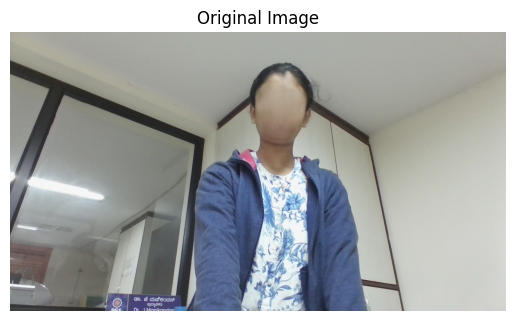

Original image size (width, height): (1920, 1080)

Original image pixel values (H, W, C):
[[[162 163 149]
  [164 165 151]
  [168 166 153]
  ...
  [166 169 152]
  [165 169 155]
  [164 168 154]]

 [[163 164 150]
  [165 166 150]
  [167 168 154]
  ...
  [167 169 155]
  [166 170 156]
  [166 170 156]]

 [[164 167 150]
  [165 168 149]
  [166 169 152]
  ...
  [167 169 156]
  [167 170 159]
  [167 170 159]]

 ...

 [[ 58  59  63]
  [ 58  59  63]
  [ 59  60  62]
  ...
  [208 208 208]
  [208 208 208]
  [208 208 208]]

 [[ 58  59  63]
  [ 58  59  63]
  [ 59  60  62]
  ...
  [209 209 209]
  [209 209 209]
  [209 209 209]]

 [[ 57  58  62]
  [ 58  59  63]
  [ 58  59  61]
  ...
  [209 209 209]
  [209 209 209]
  [210 210 210]]]
Sample pixel at (0,0): [162 163 149]

Input image tensor shape: torch.Size([1, 3, 1080, 1920])

Image tensor values (sample [0, :, 0, 0]):
tensor([0.6353, 0.6392, 0.5843])


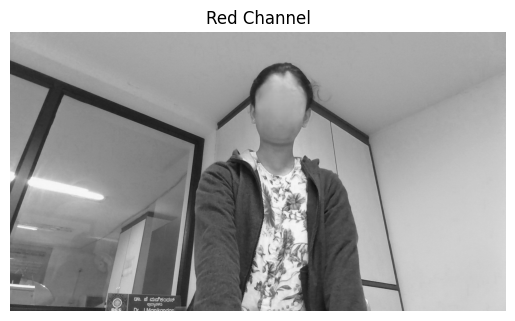


Red Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.6353, 0.6431, 0.6588,  ..., 0.6510, 0.6471, 0.6431],
        [0.6392, 0.6471, 0.6549,  ..., 0.6549, 0.6510, 0.6510],
        [0.6431, 0.6471, 0.6510,  ..., 0.6549, 0.6549, 0.6549],
        ...,
        [0.2275, 0.2275, 0.2314,  ..., 0.8157, 0.8157, 0.8157],
        [0.2275, 0.2275, 0.2314,  ..., 0.8196, 0.8196, 0.8196],
        [0.2235, 0.2275, 0.2275,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.6352941393852234


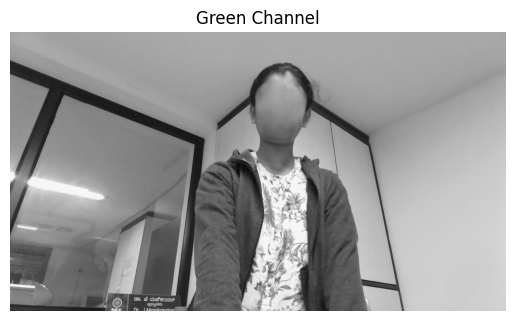


Green Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.6392, 0.6471, 0.6510,  ..., 0.6627, 0.6627, 0.6588],
        [0.6431, 0.6510, 0.6588,  ..., 0.6627, 0.6667, 0.6667],
        [0.6549, 0.6588, 0.6627,  ..., 0.6627, 0.6667, 0.6667],
        ...,
        [0.2314, 0.2314, 0.2353,  ..., 0.8157, 0.8157, 0.8157],
        [0.2314, 0.2314, 0.2353,  ..., 0.8196, 0.8196, 0.8196],
        [0.2275, 0.2314, 0.2314,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.6392157077789307


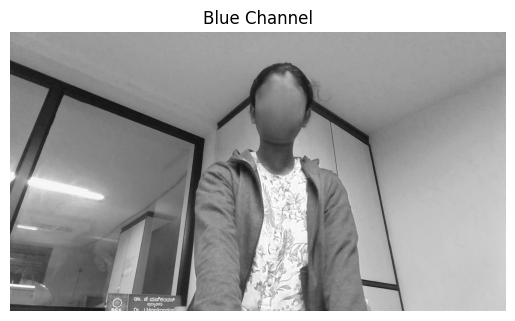


Blue Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.5843, 0.5922, 0.6000,  ..., 0.5961, 0.6078, 0.6039],
        [0.5882, 0.5882, 0.6039,  ..., 0.6078, 0.6118, 0.6118],
        [0.5882, 0.5843, 0.5961,  ..., 0.6118, 0.6235, 0.6235],
        ...,
        [0.2471, 0.2471, 0.2431,  ..., 0.8157, 0.8157, 0.8157],
        [0.2471, 0.2471, 0.2431,  ..., 0.8196, 0.8196, 0.8196],
        [0.2431, 0.2471, 0.2392,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.5843137502670288

After 1×1 conv, output shape: torch.Size([1, 2, 1080, 1920])


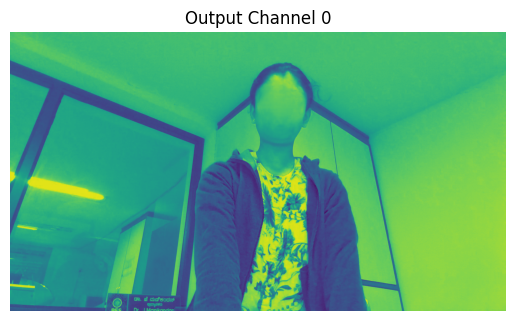


Output Channel 0 values:
tensor([[0.6181, 0.6224, 0.6285,  ..., 0.6319, 0.6256, 0.6234],
        [0.6203, 0.6276, 0.6289,  ..., 0.6292, 0.6277, 0.6277],
        [0.6276, 0.6328, 0.6319,  ..., 0.6277, 0.6250, 0.6250],
        ...,
        [0.3669, 0.3669, 0.3721,  ..., 0.6955, 0.6955, 0.6955],
        [0.3669, 0.3669, 0.3721,  ..., 0.6976, 0.6976, 0.6976],
        [0.3647, 0.3669, 0.3699,  ..., 0.6976, 0.6976, 0.6998]])
Sample (0,0): 0.6181151270866394


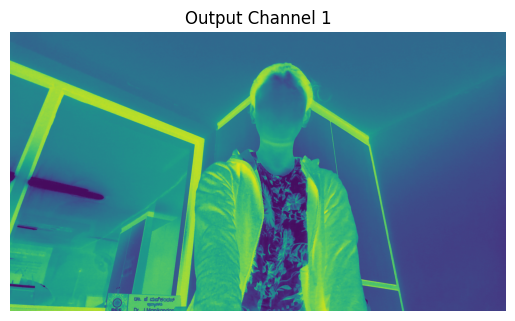


Output Channel 1 values:
tensor([[-0.0380, -0.0430, -0.0500,  ..., -0.0493, -0.0489, -0.0464],
        [-0.0405, -0.0449, -0.0506,  ..., -0.0517, -0.0514, -0.0514],
        [-0.0443, -0.0461, -0.0493,  ..., -0.0520, -0.0539, -0.0539],
        ...,
        [ 0.2176,  0.2176,  0.2158,  ..., -0.1574, -0.1574, -0.1574],
        [ 0.2176,  0.2176,  0.2158,  ..., -0.1599, -0.1599, -0.1599],
        [ 0.2202,  0.2176,  0.2183,  ..., -0.1599, -0.1599, -0.1624]])
Sample (0,0): -0.037983208894729614

1×1 Convolution Weights (2 output filters, each with 3 weights):

Filter 0: [R, G, B] weights = [0.4649970233440399, 0.47208619117736816, -0.38823047280311584]
Filter 1: [R, G, B] weights = [-0.35326120257377625, -0.20160521566867828, -0.08696495741605759]

Bias terms:
Bias 0: 0.2477887123823166
Bias 1: 0.36612558364868164


In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# 1. Load image
img_path = '/content/drive/MyDrive/peddet_2_1.jpg'
img = Image.open(img_path).convert('RGB')

# 2. Print original image
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')
plt.show()
print(f"Original image size (width, height): {img.size}")

# Print pixel values (as numpy array)
img_np = np.array(img)
print("\nOriginal image pixel values (H, W, C):")
print(img_np)
print("Sample pixel at (0,0):", img_np[0, 0])  # Just a sample pixel

# 3. Transform image → Tensor
transform = T.Compose([
    T.ToTensor()  # [C, H, W], values in [0,1]
])
img_tensor = transform(img).unsqueeze(0)  # [1, 3, H, W]
print(f"\nInput image tensor shape: {img_tensor.shape}")

# Print pixel values of tensor
print("\nImage tensor values (sample [0, :, 0, 0]):")
print(img_tensor[0, :, 0, 0])  # RGB values of pixel at (0,0)

# 4. Show individual RGB channels as grayscale
channels = ['Red', 'Green', 'Blue']
for i in range(3):
    plt.imshow(img_tensor[0, i], cmap='gray')
    plt.title(f"{channels[i]} Channel")
    plt.axis('off')
    plt.show()

    # Print some values from the channel
    print(f"\n{channels[i]} Channel tensor values (shape: {img_tensor[0, i].shape})")
    print(img_tensor[0, i])  # Print entire channel (can be large)
    print(f"Sample (0,0): {img_tensor[0, i, 0, 0].item()}")

# 5. Define 1×1 convolution: 3 input → 2 output channels
conv1x1 = nn.Conv2d(in_channels=3, out_channels=2, kernel_size=1)
output = conv1x1(img_tensor)
print(f"\nAfter 1×1 conv, output shape: {output.shape}")  # [1, 2, H, W]

# 6. Plot both output channels
for i in range(output.shape[1]):
    plt.imshow(output[0, i].detach(), cmap='viridis')
    plt.title(f"Output Channel {i}")
    plt.axis('off')
    plt.show()

    # Print values
    print(f"\nOutput Channel {i} values:")
    print(output[0, i].detach())  # Full tensor
    print(f"Sample (0,0): {output[0, i, 0, 0].item()}")

# 7. Print weights for both filters
print("\n1×1 Convolution Weights (2 output filters, each with 3 weights):\n")
for i in range(conv1x1.out_channels):
    weights = conv1x1.weight[i].view(-1)
    print(f"Filter {i}: [R, G, B] weights = {weights.tolist()}")

# 8. Print biases
print("\nBias terms:")
for i in range(conv1x1.out_channels):
    print(f"Bias {i}: {conv1x1.bias[i].item()}")


**convolution 4 channel output**

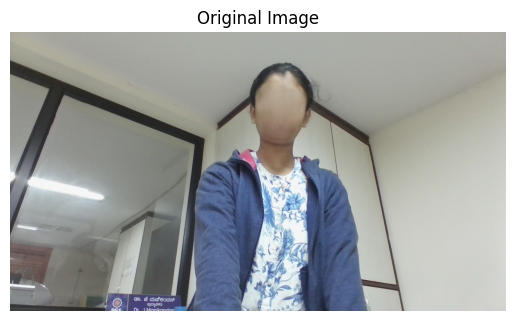

Original image size (width, height): (1920, 1080)

Original image pixel values (H, W, C):
[[[162 163 149]
  [164 165 151]
  [168 166 153]
  ...
  [166 169 152]
  [165 169 155]
  [164 168 154]]

 [[163 164 150]
  [165 166 150]
  [167 168 154]
  ...
  [167 169 155]
  [166 170 156]
  [166 170 156]]

 [[164 167 150]
  [165 168 149]
  [166 169 152]
  ...
  [167 169 156]
  [167 170 159]
  [167 170 159]]

 ...

 [[ 58  59  63]
  [ 58  59  63]
  [ 59  60  62]
  ...
  [208 208 208]
  [208 208 208]
  [208 208 208]]

 [[ 58  59  63]
  [ 58  59  63]
  [ 59  60  62]
  ...
  [209 209 209]
  [209 209 209]
  [209 209 209]]

 [[ 57  58  62]
  [ 58  59  63]
  [ 58  59  61]
  ...
  [209 209 209]
  [209 209 209]
  [210 210 210]]]
Sample pixel at (0,0): [162 163 149]

Input image tensor shape: torch.Size([1, 3, 1080, 1920])

Image tensor values (sample [0, :, 0, 0]):
tensor([0.6353, 0.6392, 0.5843])


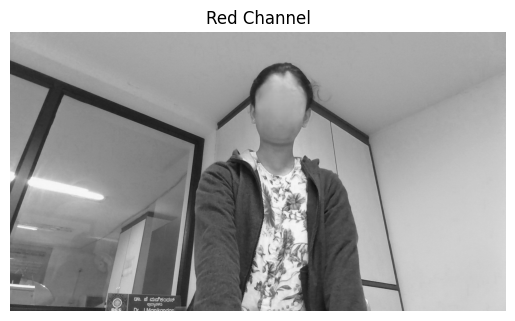


Red Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.6353, 0.6431, 0.6588,  ..., 0.6510, 0.6471, 0.6431],
        [0.6392, 0.6471, 0.6549,  ..., 0.6549, 0.6510, 0.6510],
        [0.6431, 0.6471, 0.6510,  ..., 0.6549, 0.6549, 0.6549],
        ...,
        [0.2275, 0.2275, 0.2314,  ..., 0.8157, 0.8157, 0.8157],
        [0.2275, 0.2275, 0.2314,  ..., 0.8196, 0.8196, 0.8196],
        [0.2235, 0.2275, 0.2275,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.6352941393852234


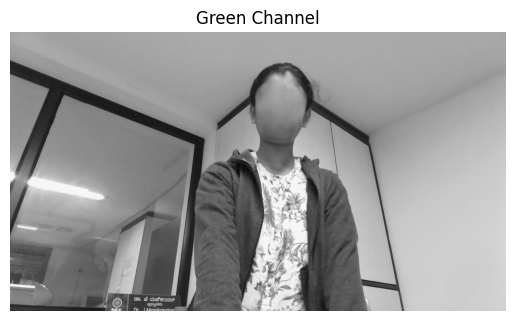


Green Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.6392, 0.6471, 0.6510,  ..., 0.6627, 0.6627, 0.6588],
        [0.6431, 0.6510, 0.6588,  ..., 0.6627, 0.6667, 0.6667],
        [0.6549, 0.6588, 0.6627,  ..., 0.6627, 0.6667, 0.6667],
        ...,
        [0.2314, 0.2314, 0.2353,  ..., 0.8157, 0.8157, 0.8157],
        [0.2314, 0.2314, 0.2353,  ..., 0.8196, 0.8196, 0.8196],
        [0.2275, 0.2314, 0.2314,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.6392157077789307


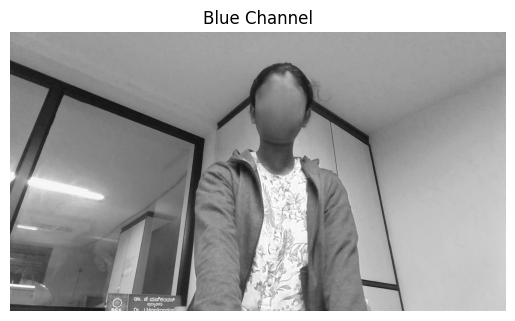


Blue Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.5843, 0.5922, 0.6000,  ..., 0.5961, 0.6078, 0.6039],
        [0.5882, 0.5882, 0.6039,  ..., 0.6078, 0.6118, 0.6118],
        [0.5882, 0.5843, 0.5961,  ..., 0.6118, 0.6235, 0.6235],
        ...,
        [0.2471, 0.2471, 0.2431,  ..., 0.8157, 0.8157, 0.8157],
        [0.2471, 0.2471, 0.2431,  ..., 0.8196, 0.8196, 0.8196],
        [0.2431, 0.2471, 0.2392,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.5843137502670288

After 1×1 conv, output shape: torch.Size([1, 4, 1080, 1920])


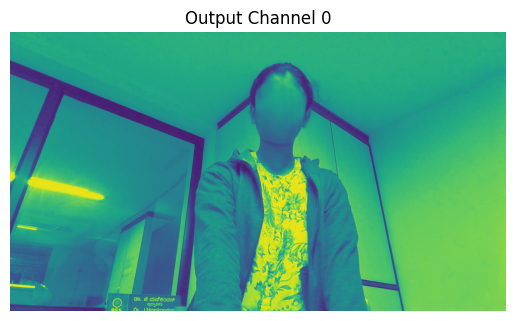


Output Channel 0 values:
tensor([[0.8966, 0.9012, 0.9071,  ..., 0.9032, 0.9085, 0.9063],
        [0.8989, 0.8995, 0.9080,  ..., 0.9097, 0.9108, 0.9108],
        [0.8987, 0.8970, 0.9032,  ..., 0.9117, 0.9173, 0.9173],
        ...,
        [0.6953, 0.6953, 0.6936,  ..., 1.0271, 1.0271, 1.0271],
        [0.6953, 0.6953, 0.6936,  ..., 1.0294, 1.0294, 1.0294],
        [0.6930, 0.6953, 0.6914,  ..., 1.0294, 1.0294, 1.0317]])
Sample (0,0): 0.8966083526611328


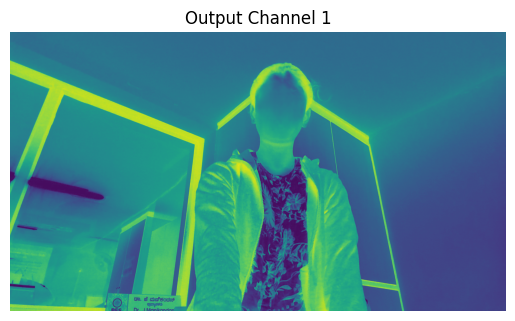


Output Channel 1 values:
tensor([[-0.1388, -0.1452, -0.1541,  ..., -0.1506, -0.1539, -0.1507],
        [-0.1420, -0.1453, -0.1548,  ..., -0.1566, -0.1571, -0.1571],
        [-0.1442, -0.1444, -0.1506,  ..., -0.1582, -0.1631, -0.1631],
        ...,
        [ 0.1665,  0.1665,  0.1663,  ..., -0.3059, -0.3059, -0.3059],
        [ 0.1665,  0.1665,  0.1663,  ..., -0.3091, -0.3091, -0.3091],
        [ 0.1697,  0.1665,  0.1695,  ..., -0.3091, -0.3091, -0.3123]])
Sample (0,0): -0.13881221413612366


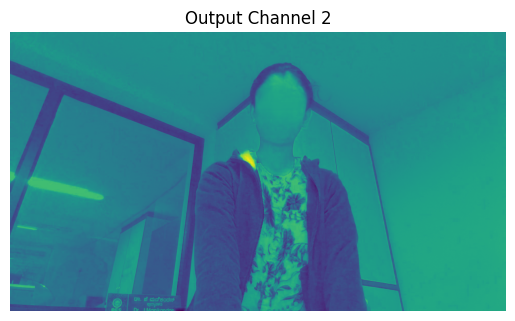


Output Channel 2 values:
tensor([[-0.0662, -0.0647, -0.0591,  ..., -0.0652, -0.0669, -0.0676],
        [-0.0655, -0.0641, -0.0626,  ..., -0.0636, -0.0662, -0.0662],
        [-0.0667, -0.0660, -0.0652,  ..., -0.0636, -0.0645, -0.0645],
        ...,
        [-0.1394, -0.1394, -0.1387,  ..., -0.0327, -0.0327, -0.0327],
        [-0.1394, -0.1394, -0.1387,  ..., -0.0320, -0.0320, -0.0320],
        [-0.1401, -0.1394, -0.1394,  ..., -0.0320, -0.0320, -0.0313]])
Sample (0,0): -0.06615874916315079


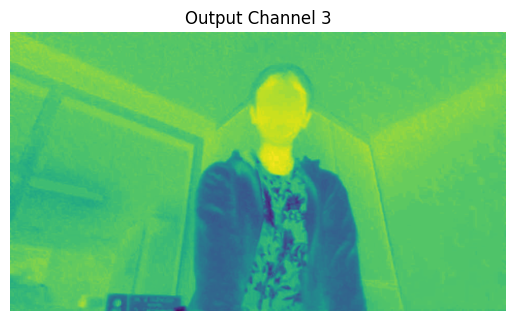


Output Channel 3 values:
tensor([[-0.4249, -0.4249, -0.4242,  ..., -0.4211, -0.4276, -0.4276],
        [-0.4249, -0.4211, -0.4250,  ..., -0.4259, -0.4277, -0.4277],
        [-0.4210, -0.4172, -0.4211,  ..., -0.4278, -0.4325, -0.4325],
        ...,
        [-0.4570, -0.4570, -0.4532,  ..., -0.4516, -0.4516, -0.4516],
        [-0.4570, -0.4570, -0.4532,  ..., -0.4516, -0.4516, -0.4516],
        [-0.4569, -0.4570, -0.4532,  ..., -0.4516, -0.4516, -0.4516]])
Sample (0,0): -0.424885630607605

1×1 Convolution Weights (2 output filters, each with 3 weights):

Filter 0: [R, G, B] weights = [0.14696188271045685, -0.06803498417139053, 0.5015004277229309]
Filter 1: [R, G, B] weights = [-0.35223203897476196, -0.0713430792093277, -0.39292100071907043]
Filter 2: [R, G, B] weights = [0.42010894417762756, -0.2422260344028473, 0.0019419118762016296]
Filter 3: [R, G, B] weights = [0.22274881601333618, 0.25702062249183655, -0.4850676953792572]

Bias terms:
Bias 0: 0.5536997318267822
Bias 1: 0.3601514697

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# 1. Load image
img_path = '/content/drive/MyDrive/peddet_2_1.jpg'
img = Image.open(img_path).convert('RGB')

# 2. Print original image
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')
plt.show()
print(f"Original image size (width, height): {img.size}")

# Print pixel values (as numpy array)
img_np = np.array(img)
print("\nOriginal image pixel values (H, W, C):")
print(img_np)
print("Sample pixel at (0,0):", img_np[0, 0])  # Just a sample pixel

# 3. Transform image → Tensor
transform = T.Compose([
    T.ToTensor()  # [C, H, W], values in [0,1]
])
img_tensor = transform(img).unsqueeze(0)  # [1, 3, H, W]
print(f"\nInput image tensor shape: {img_tensor.shape}")

# Print pixel values of tensor
print("\nImage tensor values (sample [0, :, 0, 0]):")
print(img_tensor[0, :, 0, 0])  # RGB values of pixel at (0,0)

# 4. Show individual RGB channels as grayscale
channels = ['Red', 'Green', 'Blue']
for i in range(3):
    plt.imshow(img_tensor[0, i], cmap='gray')
    plt.title(f"{channels[i]} Channel")
    plt.axis('off')
    plt.show()

    # Print some values from the channel
    print(f"\n{channels[i]} Channel tensor values (shape: {img_tensor[0, i].shape})")
    print(img_tensor[0, i])  # Print entire channel (can be large)
    print(f"Sample (0,0): {img_tensor[0, i, 0, 0].item()}")

# 5. Define 1×1 convolution: 3 input → 2 output channels
conv1x1 = nn.Conv2d(in_channels=3, out_channels=4, kernel_size=1)
output4 = conv1x1(img_tensor)
print(f"\nAfter 1×1 conv, output shape: {output4.shape}")  # [1, 2, H, W]

# 6. Plot both output channels
for i in range(output4.shape[1]):
    plt.imshow(output4[0, i].detach(), cmap='viridis')
    plt.title(f"Output Channel {i}")
    plt.axis('off')
    plt.show()

    # Print values
    print(f"\nOutput Channel {i} values:")
    print(output4[0, i].detach())  # Full tensor
    print(f"Sample (0,0): {output4[0, i, 0, 0].item()}")

# 7. Print weights for both filters
print("\n1×1 Convolution Weights (2 output filters, each with 3 weights):\n")
for i in range(conv1x1.out_channels):
    weights = conv1x1.weight[i].view(-1)
    print(f"Filter {i}: [R, G, B] weights = {weights.tolist()}")

# 8. Print biases
print("\nBias terms:")
for i in range(conv1x1.out_channels):
    print(f"Bias {i}: {conv1x1.bias[i].item()}")

hardcoded weights as used in ss example - 2 channel output

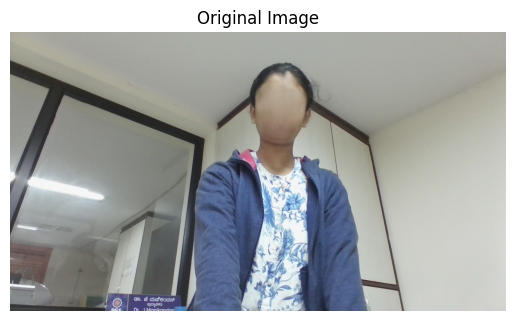

Original image size (width, height): (1920, 1080)

Original image pixel values (H, W, C):
[[[162 163 149]
  [164 165 151]
  [168 166 153]
  ...
  [166 169 152]
  [165 169 155]
  [164 168 154]]

 [[163 164 150]
  [165 166 150]
  [167 168 154]
  ...
  [167 169 155]
  [166 170 156]
  [166 170 156]]

 [[164 167 150]
  [165 168 149]
  [166 169 152]
  ...
  [167 169 156]
  [167 170 159]
  [167 170 159]]

 ...

 [[ 58  59  63]
  [ 58  59  63]
  [ 59  60  62]
  ...
  [208 208 208]
  [208 208 208]
  [208 208 208]]

 [[ 58  59  63]
  [ 58  59  63]
  [ 59  60  62]
  ...
  [209 209 209]
  [209 209 209]
  [209 209 209]]

 [[ 57  58  62]
  [ 58  59  63]
  [ 58  59  61]
  ...
  [209 209 209]
  [209 209 209]
  [210 210 210]]]
Sample pixel at (0,0): [162 163 149]

Input image tensor shape: torch.Size([1, 3, 1080, 1920])

Image tensor values (sample [0, :, 0, 0]):
tensor([0.6353, 0.6392, 0.5843])


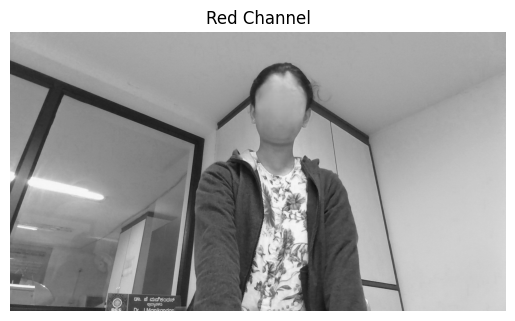


Red Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.6353, 0.6431, 0.6588,  ..., 0.6510, 0.6471, 0.6431],
        [0.6392, 0.6471, 0.6549,  ..., 0.6549, 0.6510, 0.6510],
        [0.6431, 0.6471, 0.6510,  ..., 0.6549, 0.6549, 0.6549],
        ...,
        [0.2275, 0.2275, 0.2314,  ..., 0.8157, 0.8157, 0.8157],
        [0.2275, 0.2275, 0.2314,  ..., 0.8196, 0.8196, 0.8196],
        [0.2235, 0.2275, 0.2275,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.6352941393852234


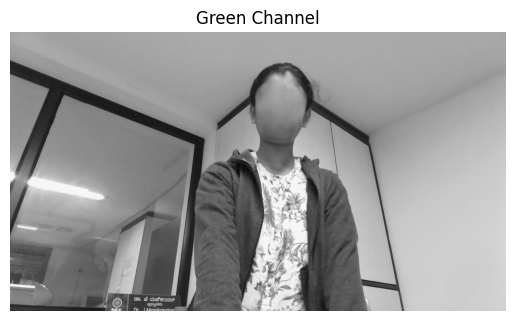


Green Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.6392, 0.6471, 0.6510,  ..., 0.6627, 0.6627, 0.6588],
        [0.6431, 0.6510, 0.6588,  ..., 0.6627, 0.6667, 0.6667],
        [0.6549, 0.6588, 0.6627,  ..., 0.6627, 0.6667, 0.6667],
        ...,
        [0.2314, 0.2314, 0.2353,  ..., 0.8157, 0.8157, 0.8157],
        [0.2314, 0.2314, 0.2353,  ..., 0.8196, 0.8196, 0.8196],
        [0.2275, 0.2314, 0.2314,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.6392157077789307


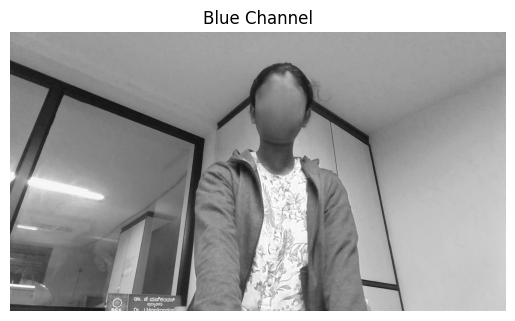


Blue Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.5843, 0.5922, 0.6000,  ..., 0.5961, 0.6078, 0.6039],
        [0.5882, 0.5882, 0.6039,  ..., 0.6078, 0.6118, 0.6118],
        [0.5882, 0.5843, 0.5961,  ..., 0.6118, 0.6235, 0.6235],
        ...,
        [0.2471, 0.2471, 0.2431,  ..., 0.8157, 0.8157, 0.8157],
        [0.2471, 0.2471, 0.2431,  ..., 0.8196, 0.8196, 0.8196],
        [0.2431, 0.2471, 0.2392,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.5843137502670288

After 1×1 conv, output shape: torch.Size([1, 2, 1080, 1920])


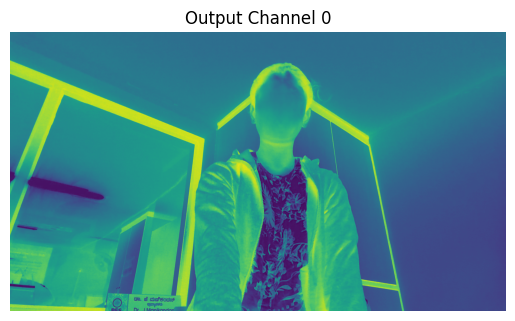


Output Channel 0 values:
tensor([[-0.7046, -0.7122, -0.7169,  ..., -0.7221, -0.7281, -0.7243],
        [-0.7084, -0.7122, -0.7234,  ..., -0.7275, -0.7318, -0.7318],
        [-0.7146, -0.7146, -0.7221,  ..., -0.7294, -0.7372, -0.7372],
        ...,
        [-0.3474, -0.3474, -0.3474,  ..., -0.8999, -0.8999, -0.8999],
        [-0.3474, -0.3474, -0.3474,  ..., -0.9037, -0.9037, -0.9037],
        [-0.3437, -0.3474, -0.3437,  ..., -0.9037, -0.9037, -0.9074]])
Sample (0,0): -0.7046356201171875


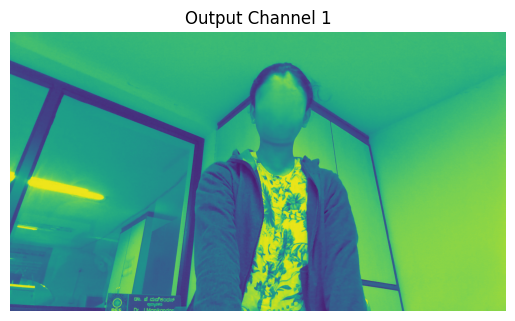


Output Channel 1 values:
tensor([[0.3381, 0.3434, 0.3498,  ..., 0.3522, 0.3497, 0.3471],
        [0.3407, 0.3467, 0.3513,  ..., 0.3525, 0.3524, 0.3524],
        [0.3469, 0.3502, 0.3522,  ..., 0.3522, 0.3527, 0.3527],
        ...,
        [0.0573, 0.0573, 0.0607,  ..., 0.4534, 0.4534, 0.4534],
        [0.0573, 0.0573, 0.0607,  ..., 0.4560, 0.4560, 0.4560],
        [0.0547, 0.0573, 0.0580,  ..., 0.4560, 0.4560, 0.4587]])
Sample (0,0): 0.33808016777038574

1×1 Convolution Weights (2 output filters, each with 3 weights):

Filter 0: [R, G, B] weights = [0.074398934841156, -0.5532619953155518, -0.48005443811416626]
Filter 1: [R, G, B] weights = [0.3554247319698334, 0.4062478840351105, -0.08865971863269806]

Bias terms:
Bias 0: -0.11774462461471558
Bias 1: -0.09559402614831924


In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# 1. Load image
img_path = '/content/drive/MyDrive/peddet_2_1.jpg'
img = Image.open(img_path).convert('RGB')

# 2. Print original image
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')
plt.show()
print(f"Original image size (width, height): {img.size}")

# Print pixel values (as numpy array)
img_np = np.array(img)
print("\nOriginal image pixel values (H, W, C):")
print(img_np)
print("Sample pixel at (0,0):", img_np[0, 0])  # Just a sample pixel

# 3. Transform image → Tensor
transform = T.Compose([
    T.ToTensor()  # [C, H, W], values in [0,1]
])
img_tensor = transform(img).unsqueeze(0)  # [1, 3, H, W]
print(f"\nInput image tensor shape: {img_tensor.shape}")

# Print pixel values of tensor
print("\nImage tensor values (sample [0, :, 0, 0]):")
print(img_tensor[0, :, 0, 0])  # RGB values of pixel at (0,0)

# 4. Show individual RGB channels as grayscale
channels = ['Red', 'Green', 'Blue']
for i in range(3):
    plt.imshow(img_tensor[0, i], cmap='gray')
    plt.title(f"{channels[i]} Channel")
    plt.axis('off')
    plt.show()

    # Print some values from the channel
    print(f"\n{channels[i]} Channel tensor values (shape: {img_tensor[0, i].shape})")
    print(img_tensor[0, i])  # Print entire channel (can be large)
    print(f"Sample (0,0): {img_tensor[0, i, 0, 0].item()}")

# 5. Define 1×1 convolution: 3 input → 2 output channels
conv1x1 = nn.Conv2d(in_channels=3, out_channels=2, kernel_size=1)

# Manually set custom weights and biases
with torch.no_grad():
    conv1x1.weight = nn.Parameter(torch.tensor([
        [[[0.074398934841156]],    # Filter 0 - R
         [[-0.5532619953155518]],  # G
         [[-0.48005443811416626]]],# B

        [[[0.3554247319698334]],   # Filter 1 - R
         [[0.4062478840351105]],   # G
         [[-0.08865971863269806]]] # B
    ]))

    conv1x1.bias = nn.Parameter(torch.tensor([
        -0.11774462461471558,
        -0.09559402614831924
    ]))

output = conv1x1(img_tensor)
print(f"\nAfter 1×1 conv, output shape: {output.shape}")  # [1, 2, H, W]

# 6. Plot both output channels
for i in range(output.shape[1]):
    plt.imshow(output[0, i].detach(), cmap='viridis')
    plt.title(f"Output Channel {i}")
    plt.axis('off')
    plt.show()

    # Print values
    print(f"\nOutput Channel {i} values:")
    print(output[0, i].detach())  # Full tensor
    print(f"Sample (0,0): {output[0, i, 0, 0].item()}")

# 7. Print weights for both filters
print("\n1×1 Convolution Weights (2 output filters, each with 3 weights):\n")
for i in range(conv1x1.out_channels):
    weights = conv1x1.weight[i].view(-1)
    print(f"Filter {i}: [R, G, B] weights = {weights.tolist()}")

# 8. Print biases
print("\nBias terms:")
for i in range(conv1x1.out_channels):
    print(f"Bias {i}: {conv1x1.bias[i].item()}")


hardcoded weights as used in ss example - 4 channel output

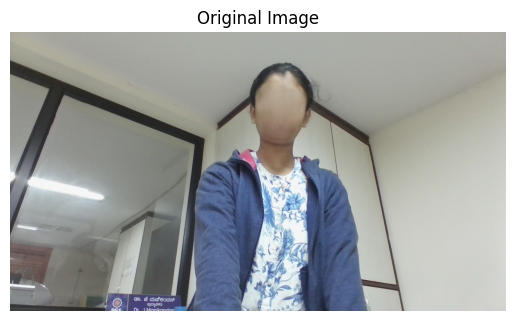

Original image size (width, height): (1920, 1080)

Original image pixel values (H, W, C):
[[[162 163 149]
  [164 165 151]
  [168 166 153]
  ...
  [166 169 152]
  [165 169 155]
  [164 168 154]]

 [[163 164 150]
  [165 166 150]
  [167 168 154]
  ...
  [167 169 155]
  [166 170 156]
  [166 170 156]]

 [[164 167 150]
  [165 168 149]
  [166 169 152]
  ...
  [167 169 156]
  [167 170 159]
  [167 170 159]]

 ...

 [[ 58  59  63]
  [ 58  59  63]
  [ 59  60  62]
  ...
  [208 208 208]
  [208 208 208]
  [208 208 208]]

 [[ 58  59  63]
  [ 58  59  63]
  [ 59  60  62]
  ...
  [209 209 209]
  [209 209 209]
  [209 209 209]]

 [[ 57  58  62]
  [ 58  59  63]
  [ 58  59  61]
  ...
  [209 209 209]
  [209 209 209]
  [210 210 210]]]
Sample pixel at (0,0): [162 163 149]

Input image tensor shape: torch.Size([1, 3, 1080, 1920])

Image tensor values (sample [0, :, 0, 0]):
tensor([0.6353, 0.6392, 0.5843])


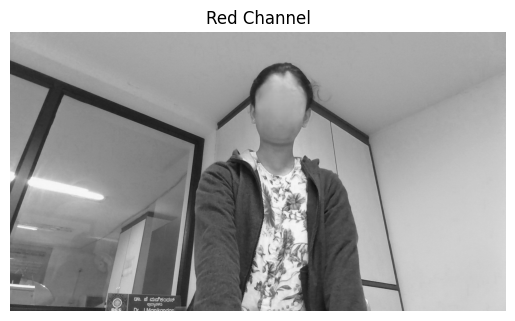


Red Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.6353, 0.6431, 0.6588,  ..., 0.6510, 0.6471, 0.6431],
        [0.6392, 0.6471, 0.6549,  ..., 0.6549, 0.6510, 0.6510],
        [0.6431, 0.6471, 0.6510,  ..., 0.6549, 0.6549, 0.6549],
        ...,
        [0.2275, 0.2275, 0.2314,  ..., 0.8157, 0.8157, 0.8157],
        [0.2275, 0.2275, 0.2314,  ..., 0.8196, 0.8196, 0.8196],
        [0.2235, 0.2275, 0.2275,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.6352941393852234


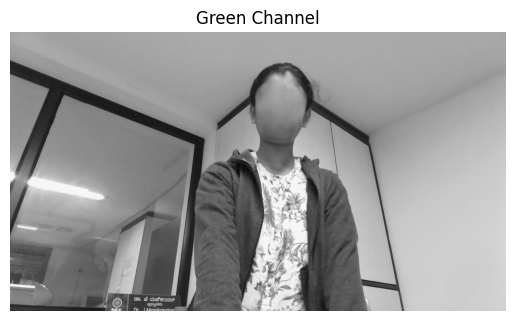


Green Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.6392, 0.6471, 0.6510,  ..., 0.6627, 0.6627, 0.6588],
        [0.6431, 0.6510, 0.6588,  ..., 0.6627, 0.6667, 0.6667],
        [0.6549, 0.6588, 0.6627,  ..., 0.6627, 0.6667, 0.6667],
        ...,
        [0.2314, 0.2314, 0.2353,  ..., 0.8157, 0.8157, 0.8157],
        [0.2314, 0.2314, 0.2353,  ..., 0.8196, 0.8196, 0.8196],
        [0.2275, 0.2314, 0.2314,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.6392157077789307


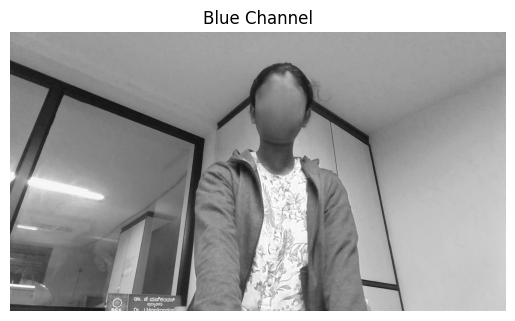


Blue Channel tensor values (shape: torch.Size([1080, 1920]))
tensor([[0.5843, 0.5922, 0.6000,  ..., 0.5961, 0.6078, 0.6039],
        [0.5882, 0.5882, 0.6039,  ..., 0.6078, 0.6118, 0.6118],
        [0.5882, 0.5843, 0.5961,  ..., 0.6118, 0.6235, 0.6235],
        ...,
        [0.2471, 0.2471, 0.2431,  ..., 0.8157, 0.8157, 0.8157],
        [0.2471, 0.2471, 0.2431,  ..., 0.8196, 0.8196, 0.8196],
        [0.2431, 0.2471, 0.2392,  ..., 0.8196, 0.8196, 0.8235]])
Sample (0,0): 0.5843137502670288

After 1×1 conv, output shape: torch.Size([1, 4, 1080, 1920])


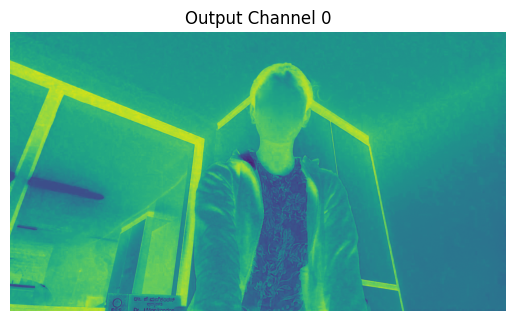


Output Channel 0 values:
tensor([[0.3034, 0.3020, 0.2983,  ..., 0.3047, 0.3011, 0.3018],
        [0.3027, 0.3041, 0.3001,  ..., 0.3000, 0.3004, 0.3004],
        [0.3060, 0.3081, 0.3047,  ..., 0.2986, 0.2957, 0.2957],
        ...,
        [0.3470, 0.3470, 0.3491,  ..., 0.2539, 0.2539, 0.2539],
        [0.3470, 0.3470, 0.3491,  ..., 0.2532, 0.2532, 0.2532],
        [0.3476, 0.3470, 0.3497,  ..., 0.2532, 0.2532, 0.2526]])
Sample (0,0): 0.3033626079559326


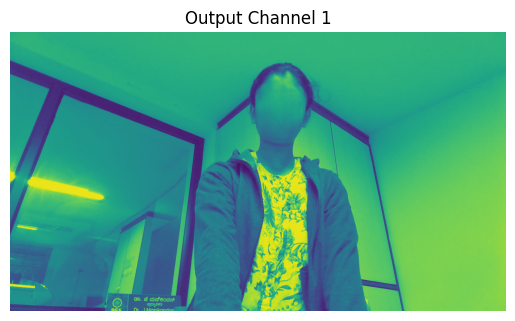


Output Channel 1 values:
tensor([[0.3140, 0.3186, 0.3235,  ..., 0.3240, 0.3258, 0.3235],
        [0.3163, 0.3192, 0.3253,  ..., 0.3270, 0.3280, 0.3280],
        [0.3195, 0.3201, 0.3240,  ..., 0.3278, 0.3310, 0.3310],
        ...,
        [0.0934, 0.0934, 0.0941,  ..., 0.4274, 0.4274, 0.4274],
        [0.0934, 0.0934, 0.0941,  ..., 0.4297, 0.4297, 0.4297],
        [0.0911, 0.0934, 0.0918,  ..., 0.4297, 0.4297, 0.4319]])
Sample (0,0): 0.31404122710227966


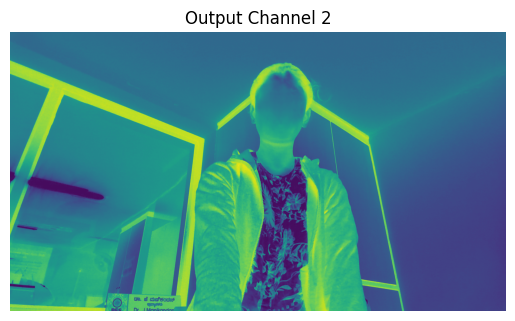


Output Channel 2 values:
tensor([[-0.7140, -0.7202, -0.7256,  ..., -0.7298, -0.7307, -0.7276],
        [-0.7171, -0.7223, -0.7294,  ..., -0.7319, -0.7337, -0.7337],
        [-0.7236, -0.7257, -0.7298,  ..., -0.7324, -0.7358, -0.7358],
        ...,
        [-0.4030, -0.4030, -0.4051,  ..., -0.8599, -0.8599, -0.8599],
        [-0.4030, -0.4030, -0.4051,  ..., -0.8630, -0.8630, -0.8630],
        [-0.4000, -0.4030, -0.4021,  ..., -0.8630, -0.8630, -0.8661]])
Sample (0,0): -0.7140382528305054


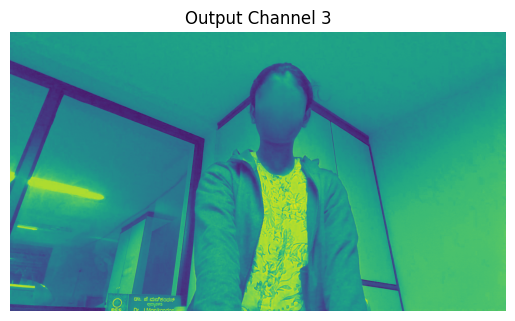


Output Channel 3 values:
tensor([[-0.3467, -0.3447, -0.3424,  ..., -0.3448, -0.3405, -0.3415],
        [-0.3457, -0.3465, -0.3416,  ..., -0.3406, -0.3394, -0.3394],
        [-0.3469, -0.3487, -0.3448,  ..., -0.3391, -0.3352, -0.3352],
        ...,
        [-0.4258, -0.4258, -0.4277,  ..., -0.2811, -0.2811, -0.2811],
        [-0.4258, -0.4258, -0.4277,  ..., -0.2801, -0.2801, -0.2801],
        [-0.4268, -0.4258, -0.4287,  ..., -0.2801, -0.2801, -0.2790]])
Sample (0,0): -0.34667807817459106

1×1 Convolution Weights (2 output filters, each with 3 weights):

Filter 0: [R, G, B] weights = [-0.14365695416927338, 0.3276728391647339, -0.3518097996711731]
Filter 1: [R, G, B] weights = [0.1562703251838684, 0.21742887794971466, 0.20235347747802734]

Bias terms:
Bias 0: 0.39074069261550903
Bias 1: -0.04245825484395027


In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# 1. Load image
img_path = '/content/drive/MyDrive/peddet_2_1.jpg'
img = Image.open(img_path).convert('RGB')

# 2. Print original image
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')
plt.show()
print(f"Original image size (width, height): {img.size}")

# Print pixel values (as numpy array)
img_np = np.array(img)
print("\nOriginal image pixel values (H, W, C):")
print(img_np)
print("Sample pixel at (0,0):", img_np[0, 0])  # Just a sample pixel

# 3. Transform image → Tensor
transform = T.Compose([
    T.ToTensor()  # [C, H, W], values in [0,1]
])
img_tensor = transform(img).unsqueeze(0)  # [1, 3, H, W]
print(f"\nInput image tensor shape: {img_tensor.shape}")

# Print pixel values of tensor
print("\nImage tensor values (sample [0, :, 0, 0]):")
print(img_tensor[0, :, 0, 0])  # RGB values of pixel at (0,0)

# 4. Show individual RGB channels as grayscale
channels = ['Red', 'Green', 'Blue']
for i in range(3):
    plt.imshow(img_tensor[0, i], cmap='gray')
    plt.title(f"{channels[i]} Channel")
    plt.axis('off')
    plt.show()

    # Print some values from the channel
    print(f"\n{channels[i]} Channel tensor values (shape: {img_tensor[0, i].shape})")
    print(img_tensor[0, i])  # Print entire channel (can be large)
    print(f"Sample (0,0): {img_tensor[0, i, 0, 0].item()}")

# 5. Define 1×1 convolution: 3 input → 2 output channels
conv1x1 = nn.Conv2d(in_channels=3, out_channels=2, kernel_size=1)

# Manually set custom weights and biases
with torch.no_grad():
    conv1x1.weight = nn.Parameter(torch.tensor([


        [[[-0.14365695416927338 ]],
         [[0.3276728391647339]],
         [[ -0.3518097996711731]]],

        [[[0.1562703251838684]],
         [[0.21742887794971466]],
         [[0.20235347747802734]]],

        [[[-0.15616275370121002]],
         [[-0.5027198195457458]],
        [[-0.12533649802207947]] ],

        [[[-0.014018449932336807]],
         [[ -0.09626074135303497,]],
         [[ 0.36790981888771057]]]

    ]))



    conv1x1.bias = nn.Parameter(torch.tensor([
        0.39074069261550903,
        -0.04245825484395027,
        -0.22024673223495483,
        -0.49121561646461487
    ]))

output = conv1x1(img_tensor)
print(f"\nAfter 1×1 conv, output shape: {output.shape}")  # [1, 2, H, W]

# 6. Plot both output channels
for i in range(output.shape[1]):
    plt.imshow(output[0, i].detach(), cmap='viridis')
    plt.title(f"Output Channel {i}")
    plt.axis('off')
    plt.show()

    # Print values
    print(f"\nOutput Channel {i} values:")
    print(output[0, i].detach())  # Full tensor
    print(f"Sample (0,0): {output[0, i, 0, 0].item()}")

# 7. Print weights for both filters
print("\n1×1 Convolution Weights (2 output filters, each with 3 weights):\n")
for i in range(conv1x1.out_channels):
    weights = conv1x1.weight[i].view(-1)
    print(f"Filter {i}: [R, G, B] weights = {weights.tolist()}")

# 8. Print biases
print("\nBias terms:")
for i in range(conv1x1.out_channels):
    print(f"Bias {i}: {conv1x1.bias[i].item()}")


Resized tensor shape: torch.Size([1, 4, 5, 10])


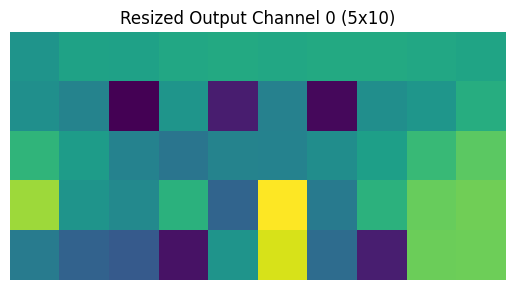

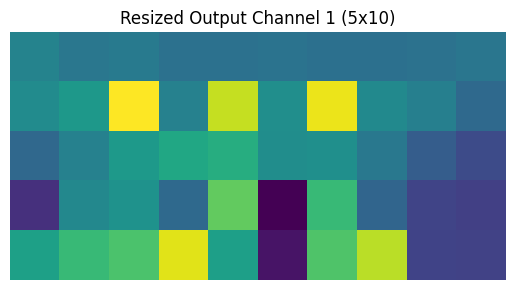

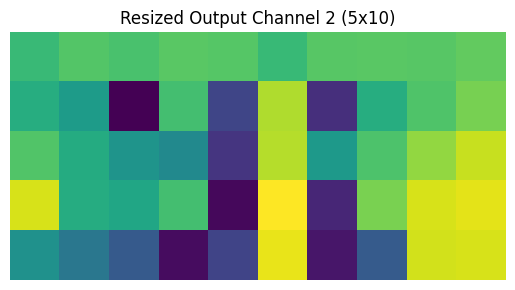

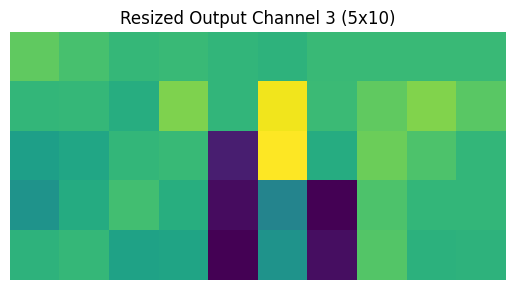

In [ ]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt



# Resize to [1, 2, 5, 10]
resized_tensor = F.interpolate(output4, size=(5, 10), mode='bilinear', align_corners=False)
tensor_sample = resized_tensor
# Print new shape
print("Resized tensor shape:", resized_tensor.shape)

# Remove batch dimension: [2, 5, 10]
resized_tensor = resized_tensor.squeeze(0)

# Plot each channel
for i in range(resized_tensor.shape[0]):
    plt.imshow(resized_tensor[i].detach().cpu(), cmap='viridis')
    plt.title(f"Resized Output Channel {i} (5x10)")
    plt.axis('off')
    plt.show()


positional encoding sample

In [ ]:
# Step 1: Clone the DETR repo and enter the directory
!git clone https://github.com/facebookresearch/detr.git
%cd detr



Cloning into 'detr'...
remote: Enumerating objects: 265, done.
remote: Total 265 (delta 0), reused 0 (delta 0), pack-reused 265 (from 1)
Receiving objects: 100% (265/265), 21.19 MiB | 17.80 MiB/s, done.
Resolving deltas: 100% (120/120), done.
/content/detr


In [ ]:

# Step 2: Import from source
import torch
import sys
sys.path.append('.')  # make sure Python can find the DETR modules

from models.position_encoding import PositionEmbeddingSine
from util.misc import NestedTensor

# Step 3: Dummy input
input_tensor = tensor_sample  # (batch, channels, height, width)
mask = torch.zeros(1, 5, 10, dtype=torch.bool)

# Step 4: Create positional encoder and compute embeddings
pos_encoder = PositionEmbeddingSine(num_pos_feats=64, normalize=True)
nested = NestedTensor(input_tensor, mask)
pos = pos_encoder(nested)

# Step 5: Print results
print(f"Input shape: {input_tensor.shape}")
print(f"Positional embedding shape: {pos.shape}")
print("Sample embedding at [0,:,0,0]:\n", pos[0, :, 0, 0])


Input shape: torch.Size([1, 4, 5, 10])
Positional embedding shape: torch.Size([1, 128, 5, 10])
Sample embedding at [0,:,0,0]:
 tensor([9.5106e-01, 3.0902e-01, 8.0894e-01, 5.8789e-01, 6.4930e-01, 7.6054e-01,
        5.0546e-01, 8.6285e-01, 3.8701e-01, 9.2208e-01, 2.9360e-01, 9.5593e-01,
        2.2161e-01, 9.7514e-01, 1.6679e-01, 9.8599e-01, 1.2533e-01, 9.9211e-01,
        9.4095e-02, 9.9556e-01, 7.0607e-02, 9.9750e-01, 5.2967e-02, 9.9860e-01,
        3.9728e-02, 9.9921e-01, 2.9795e-02, 9.9956e-01, 2.2345e-02, 9.9975e-01,
        1.6757e-02, 9.9986e-01, 1.2566e-02, 9.9992e-01, 9.4233e-03, 9.9996e-01,
        7.0665e-03, 9.9998e-01, 5.2992e-03, 9.9999e-01, 3.9738e-03, 9.9999e-01,
        2.9800e-03, 1.0000e+00, 2.2346e-03, 1.0000e+00, 1.6758e-03, 1.0000e+00,
        1.2566e-03, 1.0000e+00, 9.4234e-04, 1.0000e+00, 7.0666e-04, 1.0000e+00,
        5.2992e-04, 1.0000e+00, 3.9738e-04, 1.0000e+00, 2.9800e-04, 1.0000e+00,
        2.2347e-04, 1.0000e+00, 1.6758e-04, 1.0000e+00, 5.8779e-01, 8.090

4 channels of positional embeddings example

In [ ]:
import torch
import torch.nn as nn
import math

# Positional Embedding class (DETR-style)
class PositionEmbeddingSine(nn.Module):
    def __init__(self, num_pos_feats=2, temperature=10000, normalize=True, scale=2*math.pi):
        super().__init__()
        self.num_pos_feats = num_pos_feats
        self.temperature = temperature
        self.normalize = normalize
        self.scale = scale

    def forward(self, x):
        bs, c, h, w = x.shape
        mask = torch.zeros((bs, h, w), dtype=torch.bool, device=x.device)
        not_mask = ~mask
        y_embed = not_mask.cumsum(1, dtype=torch.float32)
        x_embed = not_mask.cumsum(2, dtype=torch.float32)

        if self.normalize:
            eps = 1e-6
            y_embed = y_embed / (y_embed[:, -1:, :] + eps) * self.scale
            x_embed = x_embed / (x_embed[:, :, -1:] + eps) * self.scale

        dim_t = torch.arange(self.num_pos_feats, dtype=torch.float32, device=x.device)
        dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)

        pos_x = x_embed[:, :, :, None] / dim_t
        pos_y = y_embed[:, :, :, None] / dim_t

        pos_x = torch.stack((pos_x[:, :, :, 0::2].sin(), pos_x[:, :, :, 1::2].cos()), dim=4).flatten(3)
        pos_y = torch.stack((pos_y[:, :, :, 0::2].sin(), pos_y[:, :, :, 1::2].cos()), dim=4).flatten(3)

        pos = torch.cat((pos_y, pos_x), dim=3).permute(0, 3, 1, 2)
        return pos

# Use dummy feature map of shape [1, 256, 25, 45]
dummy_feature_map =  tensor_sample
position_embedding = PositionEmbeddingSine(num_pos_feats=2, normalize=True)

# Compute positional embeddings
pos_embed = position_embedding(dummy_feature_map)
print("Positional Embedding Shape:", pos_embed.shape)
print(pos_embed)
print("-----------------------------------------------------------------------------------------------------")
# Get Y-direction embedding (all 128 channels)
pos_y = pos_embed[0, 0:2, :, :]  # shape: [128, 25, 45]
print("Positional Embedding y:\n", pos_y)
print("----------------------------------------------------------------------------------------------------")
# Get X-direction embedding (all 128 channels)
pos_x = pos_embed[0, 2:4, :, :]  # shape: [128, 25, 45]
print("Positional Embedding x:\n", pos_x)
print("---------------------------------------------------------------------------------------------------")

Positional Embedding Shape: torch.Size([1, 4, 5, 10])
tensor([[[[ 9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,
            9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01],
          [ 5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,
            5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01],
          [-5.8778e-01, -5.8778e-01, -5.8778e-01, -5.8778e-01, -5.8778e-01,
           -5.8778e-01, -5.8778e-01, -5.8778e-01, -5.8778e-01, -5.8778e-01],
          [-9.5106e-01, -9.5106e-01, -9.5106e-01, -9.5106e-01, -9.5106e-01,
           -9.5106e-01, -9.5106e-01, -9.5106e-01, -9.5106e-01, -9.5106e-01],
          [-7.7883e-07, -7.7883e-07, -7.7883e-07, -7.7883e-07, -7.7883e-07,
           -7.7883e-07, -7.7883e-07, -7.7883e-07, -7.7883e-07, -7.7883e-07]],

         [[ 3.0902e-01,  3.0902e-01,  3.0902e-01,  3.0902e-01,  3.0902e-01,
            3.0902e-01,  3.0902e-01,  3.0902e-01,  3.0902e-01,  3.0902e-01],
          [-8.0902e-01, -8

In [ ]:
import torch
import math

# Configuration
max_x = 45
max_y = 25
num_pos_feats = 128  # so final embedding has 2 * num_pos_feats = 4 channels
temperature = 10000
scale = 2 * math.pi
eps = 1e-6

# Get user input (adjusted for 1-based x/y)
x = int(input(f"Enter x (1 to {max_x}): ")) - 1
y = int(input(f"Enter y (1 to {max_y}): ")) - 1
i = int(input(f"Enter embedding dimension index (0 to {2 * num_pos_feats - 1}): "))

# Validate
if not (0 <= x < max_x and 0 <= y < max_y):
    raise ValueError("x or y out of bounds")
if not (0 <= i < 2 * num_pos_feats):
    raise ValueError("i must be in range [0, 3]")

# Generate normalized position embeddings
mask = torch.zeros(1, max_y, max_x, dtype=torch.bool)
not_mask = ~mask

y_embed = not_mask.cumsum(1, dtype=torch.float32)
x_embed = not_mask.cumsum(2, dtype=torch.float32)

y_embed = y_embed / (y_embed[:, -1:, :] + eps) * scale
x_embed = x_embed / (x_embed[:, :, -1:] + eps) * scale

# Frequency encoding
dim_t = torch.arange(num_pos_feats, dtype=torch.float32)
dim_t = temperature ** (2 * (dim_t // 2) / num_pos_feats)

# Get specific position value
py = y_embed[0, y, x] / dim_t
px = x_embed[0, y, x] / dim_t

# Apply sine/cosine
encoded_y = torch.stack([py[0::2].sin(), py[1::2].cos()], dim=1).flatten()
encoded_x = torch.stack([px[0::2].sin(), px[1::2].cos()], dim=1).flatten()
b
# Concatenate to get final PE vector
pos_vec = torch.cat([encoded_y, encoded_x])  # shape: [4]

# Output
print(f"\n📍 Positional encoding at (x={x+1}, y={y+1}), channel i={i}:")
print(f"➡️  Value = {pos_vec[i].item()}")


Enter x (1 to 45): 1
Enter y (1 to 25): 2
Enter embedding dimension index (0 to 255): 0

📍 Positional encoding at (x=1, y=2), channel i=0:
➡️  Value = 0.4817536473274231


In [ ]:
# Step 2: Import from source
import torch
import sys
sys.path.append('.')  # make sure Python can find the DETR modules

from models.position_encoding import PositionEmbeddingSine
from util.misc import NestedTensor

# Step 3: input
input_tensor = torch.rand(1, 2, 5, 10)  # (batch, channels, height, width)
mask = torch.zeros(1, 5, 10, dtype=torch.bool)

# Step 4: Create positional encoder and compute embeddings
pos_encoder = PositionEmbeddingSine(num_pos_feats=64, normalize=True)
nested = NestedTensor(input_tensor, mask)
pos = pos_encoder(nested)

# Step 5: Print results
print(f"Input shape: {input_tensor.shape}")
print(f"Positional embedding shape: {pos.shape}")
print("Sample embedding at [0,:,0,0]:\n", pos[0, :, 0, 0])


Input shape: torch.Size([1, 2, 5, 10])
Positional embedding shape: torch.Size([1, 128, 5, 10])
Sample embedding at [0,:,0,0]:
 tensor([9.5106e-01, 3.0902e-01, 8.0894e-01, 5.8789e-01, 6.4930e-01, 7.6054e-01,
        5.0546e-01, 8.6285e-01, 3.8701e-01, 9.2208e-01, 2.9360e-01, 9.5593e-01,
        2.2161e-01, 9.7514e-01, 1.6679e-01, 9.8599e-01, 1.2533e-01, 9.9211e-01,
        9.4095e-02, 9.9556e-01, 7.0607e-02, 9.9750e-01, 5.2967e-02, 9.9860e-01,
        3.9728e-02, 9.9921e-01, 2.9795e-02, 9.9956e-01, 2.2345e-02, 9.9975e-01,
        1.6757e-02, 9.9986e-01, 1.2566e-02, 9.9992e-01, 9.4233e-03, 9.9996e-01,
        7.0665e-03, 9.9998e-01, 5.2992e-03, 9.9999e-01, 3.9738e-03, 9.9999e-01,
        2.9800e-03, 1.0000e+00, 2.2346e-03, 1.0000e+00, 1.6758e-03, 1.0000e+00,
        1.2566e-03, 1.0000e+00, 9.4234e-04, 1.0000e+00, 7.0666e-04, 1.0000e+00,
        5.2992e-04, 1.0000e+00, 3.9738e-04, 1.0000e+00, 2.9800e-04, 1.0000e+00,
        2.2347e-04, 1.0000e+00, 1.6758e-04, 1.0000e+00, 5.8779e-01, 8.090

In [ ]:
import torch
import torch.nn as nn

# 1x1 Conv: 3 input channels (RGB) → 2 output channels
conv1x1 = nn.Conv2d(in_channels=3, out_channels=2, kernel_size=1, bias=True)

# Manually set weights and biases
with torch.no_grad():
    conv1x1.weight = nn.Parameter(torch.tensor([
        [[[-0.5613056421279907]],  # Red weight (Filter 0)
         [[-0.036828670650720596]],  # Green
         [[0.28458938002586365]]],  # Blue

        [[[0.17582771182060242]],  # Red weight (Filter 1)
         [[0.45208507776260376]],  # Green
         [[0.0031768481712788343]]]  # Blue
    ]))

    conv1x1.bias = nn.Parameter(torch.tensor([
        -0.36429303884506226,  # Bias 0
        -0.09592074155807495   # Bias 1
    ]))


In [ ]:
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)




Downloading: "https://github.com/facebookresearch/detr/zipball/main" to /root/.cache/torch/hub/main.zip
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 175MB/s]
Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cache

In [ ]:
print(model.input_proj.weight.shape)  # torch.Size([256, 2048, 1, 1])

torch.Size([256, 2048, 1, 1])


In [ ]:
# Print weights for the first 5 output channels

for i in range(5):
    weights = model.input_proj.weight[i].view(-1)  # Access via model
    print(f"\nFilter {i} weights (first 10 of 2048): {weights[:10].tolist()}")



Filter 0 weights (first 10 of 2048): [0.04604925215244293, -0.05976811796426773, 0.1652606874704361, -0.01501524355262518, 0.07263177633285522, -0.04935738816857338, -0.014781945385038853, 0.02396411821246147, 0.0865732878446579, -0.048538513481616974]

Filter 1 weights (first 10 of 2048): [0.11203869432210922, 0.054118093103170395, -0.004194522276520729, -0.09860394895076752, -0.0020485471468418837, -0.03173786401748657, -0.012075789272785187, 0.07409604638814926, -0.006135700736194849, 0.08674656599760056]

Filter 2 weights (first 10 of 2048): [0.06151922047138214, -0.008382752537727356, -0.022652698680758476, -0.1327388733625412, -0.08775924891233444, 0.06236174330115318, -0.004538791719824076, 0.11994975805282593, -0.09488903731107712, 0.03342782333493233]

Filter 3 weights (first 10 of 2048): [-0.09761172533035278, -0.08035732805728912, 0.012332066893577576, -0.020000716671347618, -0.08045009523630142, -0.1415945291519165, -0.011877968907356262, 0.07389921694993973, 0.07384261488

positional embedding for (1,256,25,45)

In [ ]:
import torch
import torch.nn as nn
import math

# Positional Embedding class (DETR-style)
class PositionEmbeddingSine(nn.Module):
    def __init__(self, num_pos_feats=128, temperature=10000, normalize=True, scale=2*math.pi):
        super().__init__()
        self.num_pos_feats = num_pos_feats
        self.temperature = temperature
        self.normalize = normalize
        self.scale = scale

    def forward(self, x):
        bs, c, h, w = x.shape
        mask = torch.zeros((bs, h, w), dtype=torch.bool, device=x.device)
        not_mask = ~mask
        y_embed = not_mask.cumsum(1, dtype=torch.float32)
        x_embed = not_mask.cumsum(2, dtype=torch.float32)

        if self.normalize:
            eps = 1e-6
            y_embed = y_embed / (y_embed[:, -1:, :] + eps) * self.scale
            x_embed = x_embed / (x_embed[:, :, -1:] + eps) * self.scale

        dim_t = torch.arange(self.num_pos_feats, dtype=torch.float32, device=x.device)
        dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)

        pos_x = x_embed[:, :, :, None] / dim_t
        pos_y = y_embed[:, :, :, None] / dim_t

        pos_x = torch.stack((pos_x[:, :, :, 0::2].sin(), pos_x[:, :, :, 1::2].cos()), dim=4).flatten(3)
        pos_y = torch.stack((pos_y[:, :, :, 0::2].sin(), pos_y[:, :, :, 1::2].cos()), dim=4).flatten(3)

        pos = torch.cat((pos_y, pos_x), dim=3).permute(0, 3, 1, 2)
        return pos

# Use dummy feature map of shape [1, 256, 25, 45]
dummy_feature_map = torch.randn(1, 256, 25, 45)
position_embedding = PositionEmbeddingSine(num_pos_feats=128, normalize=True)

# Compute positional embeddings
pos_embed = position_embedding(dummy_feature_map)
print("Positional Embedding Shape:", pos_embed.shape)
print(pos_embed)
print("-----------------------------------------------------------------------------------------------------")
# Get Y-direction embedding (all 128 channels)
pos_y = pos_embed[0, 0:128, :, :]  # shape: [128, 25, 45]
print("Positional Embedding y:\n", pos_y)
print("----------------------------------------------------------------------------------------------------")
# Get X-direction embedding (all 128 channels)
pos_x = pos_embed[0, 128:256, :, :]  # shape: [128, 25, 45]
print("Positional Embedding x:\n", pos_x)
print("---------------------------------------------------------------------------------------------------")

Positional Embedding Shape: torch.Size([1, 256, 25, 45])
tensor([[[[ 2.4869e-01,  2.4869e-01,  2.4869e-01,  ...,  2.4869e-01,
            2.4869e-01,  2.4869e-01],
          [ 4.8175e-01,  4.8175e-01,  4.8175e-01,  ...,  4.8175e-01,
            4.8175e-01,  4.8175e-01],
          [ 6.8455e-01,  6.8455e-01,  6.8455e-01,  ...,  6.8455e-01,
            6.8455e-01,  6.8455e-01],
          ...,
          [-4.8175e-01, -4.8175e-01, -4.8175e-01,  ..., -4.8175e-01,
           -4.8175e-01, -4.8175e-01],
          [-2.4869e-01, -2.4869e-01, -2.4869e-01,  ..., -2.4869e-01,
           -2.4869e-01, -2.4869e-01],
          [-3.0199e-07, -3.0199e-07, -3.0199e-07,  ..., -3.0199e-07,
           -3.0199e-07, -3.0199e-07]],

         [[ 9.6858e-01,  9.6858e-01,  9.6858e-01,  ...,  9.6858e-01,
            9.6858e-01,  9.6858e-01],
          [ 8.7631e-01,  8.7631e-01,  8.7631e-01,  ...,  8.7631e-01,
            8.7631e-01,  8.7631e-01],
          [ 7.2897e-01,  7.2897e-01,  7.2897e-01,  ...,  7.2897e-01,
 

In [ ]:
import torchvision.transforms as T
from PIL import Image
import numpy as np

# Simulate a 640x480 image
dummy_img = Image.fromarray(np.zeros((480, 640, 3), dtype=np.uint8))

transform = T.Resize(800)
resized = transform(dummy_img)
print(resized.size)  # Output is (width, height)


(1066, 800)


flatten

In [ ]:
import torch



In [ ]:
src = torch.randn(1, 256, 25, 45)  # shape: [B, C, H, W]
flattened = src.flatten(2)         # flatten from dimension 2 onwards
print(flattened.shape)


torch.Size([1, 256, 1125])


permute

In [ ]:
import torch

# Create a tensor with shape [1, 256, 1125]
x = torch.randn(1, 256, 1125)

# Permute the dimensions: (2, 0, 1)
x_permuted = x.permute(2, 0, 1)

# Check the new shape
print(x_permuted.shape)  # Output: torch.Size([1125, 1, 256])


torch.Size([1125, 1, 256])


summation tensor + pos

In [ ]:
import torch
from types import MethodType

# Load pretrained DETR model
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
model.eval()

# Define a custom with_pos_embed that prints stats
def debug_with_pos_embed(self, tensor, pos):
    if pos is None:
        print("→ No positional embedding applied.")
        return tensor
    else:
        print("→ Positional embedding applied:")
        print("Tensor shape:", tensor.shape)
        print("Pos shape:", pos.shape)
        print("Tensor mean:", tensor.mean().item())
        print("Pos mean:", pos.mean().item())
        result = tensor + pos
        print("Result mean:", result.mean().item())
        return result

# Apply override to all encoder and decoder layers
for layer in model.transformer.encoder.layers:
    layer.with_pos_embed = MethodType(debug_with_pos_embed, layer)
for layer in model.transformer.decoder.layers:
    layer.with_pos_embed = MethodType(debug_with_pos_embed, layer)

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Path to your image
image_path = '/content/drive/MyDrive/peddet_2_1.jpg'

# Load and preprocess image
from PIL import Image
from torchvision import transforms

image = Image.open(image_path).convert('RGB')

transform = transforms.Compose([
    transforms.Resize(800),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])
img = transform(image).unsqueeze(0)

# Run the model — now this will print!
outputs = model(img)


Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
→ Positional embedding applied:
Tensor shape: torch.Size([1125, 1, 256])
Pos shape: torch.Size([1125, 1, 256])
Tensor mean: -0.07317455857992172
Pos mean: 0.49422943592071533
Result mean: 0.4210548996925354
→ Positional embedding applied:
Tensor shape: torch.Size([1125, 1, 256])
Pos shape: torch.Size([1125, 1, 256])
Tensor mean: -0.04511652886867523
Pos mean: 0.49422943592071533
Result mean: 0.4491129219532013
→ Positional embedding applied:
Tensor shape: torch.Size([1125, 1, 256])
Pos shape: torch.Size([1125, 1, 256])
Tensor mean: -0.03830699995160103
Pos mean: 0.49422943592071533
Result mean: 0.4559224843978882
→ Positional embedding applied:
Tensor shape: torch.Size([1125, 1, 256])
Pos shape: torch.Size([1125, 1, 256])
Tensor mean: -0.0681309849023819
Pos mean: 0.49422943592071533
Result mean: 0.42609843611717224
→ Positional embedding applied:
Tensor shap

In [ ]:
import torch
from types import MethodType

# Load pretrained DETR model
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
model.eval()

# Custom with_pos_embed function to debug positional embeddings
def debug_with_pos_embed(self, tensor, pos):
    if not hasattr(self, "_has_printed"):
        self._has_printed = False

    if pos is None:
        print("→ No positional embedding applied.")
        return tensor
    else:
        print("→ Positional embedding applied:")
        print("Tensor shape:", tensor.shape)
        print("Pos shape:", pos.shape)
        print("Tensor mean:", tensor.mean().item())
        print("Pos mean:", pos.mean().item())
        result = tensor + pos
        print("Result mean:", result.mean().item())

        if not self._has_printed:
            print("\n>>> Tensor[0, 0, :5]:", tensor[0, 0, :5])
            print(">>> Pos[0, 0, :5]:", pos[0, 0, :5])
            print(">>> Result[0, 0, :5]:", result[0, 0, :5])
            self._has_printed = True

        return result

# Override all encoder and decoder layers
for layer in model.transformer.encoder.layers:
    layer.with_pos_embed = MethodType(debug_with_pos_embed, layer)
for layer in model.transformer.decoder.layers:
    layer.with_pos_embed = MethodType(debug_with_pos_embed, layer)

# Mount Google Drive (optional, if using Colab)
from google.colab import drive
drive.mount('/content/drive')

# Load and preprocess image
from PIL import Image
from torchvision import transforms

image_path = '/content/drive/MyDrive/peddet_2_1.jpg'
image = Image.open(image_path).convert('RGB')

transform = transforms.Compose([
    transforms.Resize(800),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])
img = transform(image).unsqueeze(0)

# Run model — debug output will show during forward pass
outputs = model(img)


Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
→ Positional embedding applied:
Tensor shape: torch.Size([1125, 1, 256])
Pos shape: torch.Size([1125, 1, 256])
Tensor mean: -0.07317455857992172
Pos mean: 0.49422943592071533
Result mean: 0.4210548996925354

>>> Tensor[0, 0, :5]: tensor([-0.0811,  0.1507,  0.3771, -0.2649, -0.4496], grad_fn=<SliceBackward0>)
>>> Pos[0, 0, :5]: tensor([0.2487, 0.9686, 0.2159, 0.9764, 0.1874])
>>> Result[0, 0, :5]: tensor([ 0.1675,  1.1193,  0.5930,  0.7115, -0.2622], grad_fn=<SliceBackward0>)
→ Positional embedding applied:
Tensor shape: torch.Size([1125, 1, 256])
Pos shape: torch.Size([1125, 1, 256])
Tensor mean: -0.04511652886867523
Pos mean: 0.49422943592071533
Result mean: 0.4491129219532013

>>> Tensor[0, 0, :5]: tensor([ 0.8718, -0.3826,  0.6859, -0.2275,  0.0864], grad_fn=<SliceBackward0>)
>>> Pos[0, 0, :5]: tensor([0.2487, 0.9686, 0.2159, 0.9764, 0.1874])
>>> Result[0,

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Simulate small input
seq_len, batch_size, d_model = 4, 1, 8  # smaller d_model for clarity
src = torch.randn(seq_len, batch_size, d_model)
pos = torch.randn_like(src)  # same shape as src

# Positional embedding
src_with_pos = src + pos  # q = k = src + pos

# Self-attention
mha = nn.MultiheadAttention(embed_dim=d_model, num_heads=2, dropout=0.0, batch_first=False)
attn_output, _ = mha(src_with_pos, src_with_pos, src)

# Residual connection + LayerNorm
dropout1 = nn.Dropout(0.0)
norm1 = nn.LayerNorm(d_model)
src_res1 = norm1(src + dropout1(attn_output))  # First residual & norm

# Feedforward
linear1 = nn.Linear(d_model, d_model * 4)
linear2 = nn.Linear(d_model * 4, d_model)
dropout = nn.Dropout(0.0)
activation = F.relu

ffn_output = linear2(dropout(activation(linear1(src_res1))))

# Second Residual connection + LayerNorm
dropout2 = nn.Dropout(0.0)
norm2 = nn.LayerNorm(d_model)
src_final = norm2(src_res1 + dropout2(ffn_output))  # Second residual & norm

# Output shape check
print("Output shape:", src_final.shape)


Output shape: torch.Size([4, 1, 8])


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class TransformerLayer(nn.Module):
    def __init__(self, d_model=256, nhead=8, dim_feedforward=2048, dropout=0.1):
        super().__init__()
        self.self_attn = nn.MultiheadAttention(d_model, nhead, dropout=dropout)
        self.linear1 = nn.Linear(d_model, dim_feedforward)
        self.dropout = nn.Dropout(dropout)
        self.linear2 = nn.Linear(dim_feedforward, d_model)
        self.norm1 = nn.LayerNorm(d_model)
        self.norm2 = nn.LayerNorm(d_model)
        self.dropout1 = nn.Dropout(dropout)
        self.dropout2 = nn.Dropout(dropout)
        self.activation = F.relu  # or use nn.ReLU()

    def with_pos_embed(self, tensor, pos):
        return tensor if pos is None else tensor + pos

    def forward_post(self, src, src_mask=None, src_key_padding_mask=None, pos=None):
        q = k = self.with_pos_embed(src, pos)
        src2 = self.self_attn(q, k, value=src, attn_mask=src_mask,
                              key_padding_mask=src_key_padding_mask)[0]
        src = src + self.dropout1(src2)
        src = self.norm1(src)
        src2 = self.linear2(self.dropout(self.activation(self.linear1(src))))
        src = src + self.dropout2(src2)
        src = self.norm2(src)
        return src

# 🔧 Create an instance of the TransformerLayer
layer = TransformerLayer()

# 🧪 Create sample input tensors
seq_len = 10
batch_size = 2
d_model = 256

# Input shape for MultiheadAttention: (S, N, E) --> (sequence_length, batch_size, embedding_dim)
src = torch.rand(seq_len, batch_size, d_model)

# Optional positional encoding
pos = torch.rand(seq_len, batch_size, d_model)

# Optional masks
src_mask = None  # shape: (seq_len, seq_len)
src_key_padding_mask = None  # shape: (batch_size, seq_len)

# 🚀 Run the forward_post logic and print each step
print("Input src shape:", src.shape)

# Step 1: Add positional encoding
q = k = layer.with_pos_embed(src, pos)
print("After pos embed:", q.shape)

# Step 2: Self-attention
src2 = layer.self_attn(q, k, value=src, attn_mask=src_mask,
                       key_padding_mask=src_key_padding_mask)[0]
print("After self-attention:", src2.shape)

# Step 3: Residual + Dropout + Norm
src = src + layer.dropout1(src2)
src = layer.norm1(src)
print("After first norm:", src.shape)

# Step 4: Feedforward
src2 = layer.linear2(layer.dropout(layer.activation(layer.linear1(src))))
print("After feedforward:", src2.shape)

# Step 5: Residual + Dropout + Norm
src = src + layer.dropout2(src2)
src = layer.norm2(src)
print("Final output:", src.shape)


Input src shape: torch.Size([10, 2, 256])
After pos embed: torch.Size([10, 2, 256])
After self-attention: torch.Size([10, 2, 256])
After first norm: torch.Size([10, 2, 256])
After feedforward: torch.Size([10, 2, 256])
Final output: torch.Size([10, 2, 256])


plotting positional encoding

In [ ]:
import torch
import torch.nn as nn
import math

# Positional Embedding class (DETR-style)
class PositionEmbeddingSine(nn.Module):
    def __init__(self, num_pos_feats=128, temperature=10000, normalize=True, scale=2*math.pi):
        super().__init__()
        self.num_pos_feats = num_pos_feats
        self.temperature = temperature
        self.normalize = normalize
        self.scale = scale

    def forward(self, x):
        bs, c, h, w = x.shape
        mask = torch.zeros((bs, h, w), dtype=torch.bool, device=x.device)
        not_mask = ~mask
        y_embed = not_mask.cumsum(1, dtype=torch.float32)
        x_embed = not_mask.cumsum(2, dtype=torch.float32)

        if self.normalize:
            eps = 1e-6
            y_embed = y_embed / (y_embed[:, -1:, :] + eps) * self.scale
            x_embed = x_embed / (x_embed[:, :, -1:] + eps) * self.scale

        dim_t = torch.arange(self.num_pos_feats, dtype=torch.float32, device=x.device)
        dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)

        pos_x = x_embed[:, :, :, None] / dim_t
        pos_y = y_embed[:, :, :, None] / dim_t

        pos_x = torch.stack((pos_x[:, :, :, 0::2].sin(), pos_x[:, :, :, 1::2].cos()), dim=4).flatten(3)
        pos_y = torch.stack((pos_y[:, :, :, 0::2].sin(), pos_y[:, :, :, 1::2].cos()), dim=4).flatten(3)

        pos = torch.cat((pos_y, pos_x), dim=3).permute(0, 3, 1, 2)

        # Save full positional encodings for y and x for i = 0
        pos_y_encoding = pos_y[0].permute(2, 0, 1)  # [H, W, C] -> [C, H, W]
        pos_x_encoding = pos_x[0].permute(2, 0, 1)  # [H, W, C] -> [C, H, W]

        return pos, pos_y_encoding, pos_x_encoding

# Dummy input feature map [B, C, H, W]
dummy_feature_map = torch.randn(1, 256, 25, 45)
position_embedding = PositionEmbeddingSine(num_pos_feats=128, normalize=True)

# Forward pass to get positional encodings and separated x/y encodings
pos_embed, saved_pos_y, saved_pos_x = position_embedding(dummy_feature_map)

# Print outputs
print("Positional Embedding Shape:", pos_embed.shape)  # [1, 256, 25, 45]
print("Saved Positional Encoding y Shape:", saved_pos_y.shape)  # [128, 25, 45]
print("Saved Positional Encoding x Shape:", saved_pos_x.shape)  # [128, 25, 45]

print("Saved Positional Encoding y:\n", saved_pos_y)
print("--------------------------------------------------------------------------------")
print("Saved Positional Encoding x:\n", saved_pos_x)


Positional Embedding Shape: torch.Size([1, 256, 25, 45])
Saved Positional Encoding y Shape: torch.Size([128, 25, 45])
Saved Positional Encoding x Shape: torch.Size([128, 25, 45])
Saved Positional Encoding y:
 tensor([[[ 2.4869e-01,  2.4869e-01,  2.4869e-01,  ...,  2.4869e-01,
           2.4869e-01,  2.4869e-01],
         [ 4.8175e-01,  4.8175e-01,  4.8175e-01,  ...,  4.8175e-01,
           4.8175e-01,  4.8175e-01],
         [ 6.8455e-01,  6.8455e-01,  6.8455e-01,  ...,  6.8455e-01,
           6.8455e-01,  6.8455e-01],
         ...,
         [-4.8175e-01, -4.8175e-01, -4.8175e-01,  ..., -4.8175e-01,
          -4.8175e-01, -4.8175e-01],
         [-2.4869e-01, -2.4869e-01, -2.4869e-01,  ..., -2.4869e-01,
          -2.4869e-01, -2.4869e-01],
         [-3.0199e-07, -3.0199e-07, -3.0199e-07,  ..., -3.0199e-07,
          -3.0199e-07, -3.0199e-07]],

        [[ 9.6858e-01,  9.6858e-01,  9.6858e-01,  ...,  9.6858e-01,
           9.6858e-01,  9.6858e-01],
         [ 8.7631e-01,  8.7631e-01,  8.7

In [ ]:
# Extract and save the 1st channel (channel 0) from the positional encoding
first_channel_y = saved_pos_y[0]  # shape: [25, 45]
first_channel_x = saved_pos_x[0]  # shape: [25, 45]


In [ ]:
print(first_channel_y)

tensor([[ 2.4869e-01,  2.4869e-01,  2.4869e-01,  ...,  2.4869e-01,
          2.4869e-01,  2.4869e-01],
        [ 4.8175e-01,  4.8175e-01,  4.8175e-01,  ...,  4.8175e-01,
          4.8175e-01,  4.8175e-01],
        [ 6.8455e-01,  6.8455e-01,  6.8455e-01,  ...,  6.8455e-01,
          6.8455e-01,  6.8455e-01],
        ...,
        [-4.8175e-01, -4.8175e-01, -4.8175e-01,  ..., -4.8175e-01,
         -4.8175e-01, -4.8175e-01],
        [-2.4869e-01, -2.4869e-01, -2.4869e-01,  ..., -2.4869e-01,
         -2.4869e-01, -2.4869e-01],
        [-3.0199e-07, -3.0199e-07, -3.0199e-07,  ..., -3.0199e-07,
         -3.0199e-07, -3.0199e-07]])


In [ ]:
print(first_channel_x)

tensor([[ 1.3917e-01,  2.7564e-01,  4.0674e-01,  ..., -2.7564e-01,
         -1.3917e-01,  1.7485e-07],
        [ 1.3917e-01,  2.7564e-01,  4.0674e-01,  ..., -2.7564e-01,
         -1.3917e-01,  1.7485e-07],
        [ 1.3917e-01,  2.7564e-01,  4.0674e-01,  ..., -2.7564e-01,
         -1.3917e-01,  1.7485e-07],
        ...,
        [ 1.3917e-01,  2.7564e-01,  4.0674e-01,  ..., -2.7564e-01,
         -1.3917e-01,  1.7485e-07],
        [ 1.3917e-01,  2.7564e-01,  4.0674e-01,  ..., -2.7564e-01,
         -1.3917e-01,  1.7485e-07],
        [ 1.3917e-01,  2.7564e-01,  4.0674e-01,  ..., -2.7564e-01,
         -1.3917e-01,  1.7485e-07]])


flatten

In [ ]:
flattened_y = first_channel_y.flatten()  # or .view(-1)
print(flattened_y.shape)  # torch.Size([1125])
print(flattened_y)



torch.Size([1125])
tensor([ 2.4869e-01,  2.4869e-01,  2.4869e-01,  ..., -3.0199e-07,
        -3.0199e-07, -3.0199e-07])


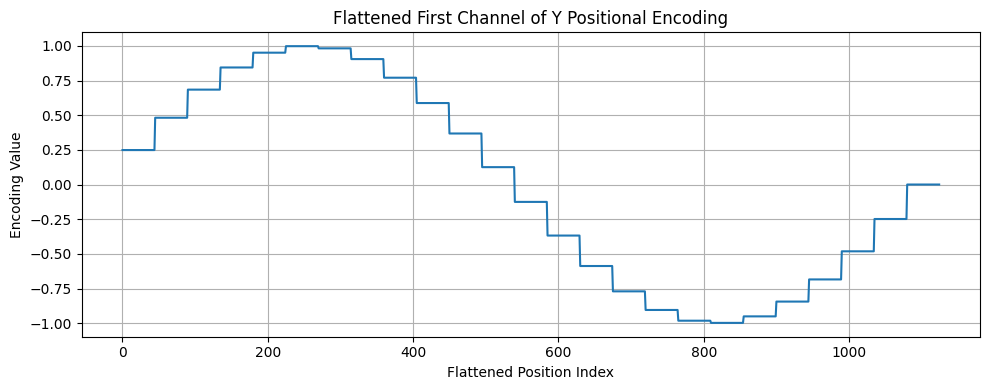

In [ ]:
import matplotlib.pyplot as plt

# Flatten the tensor
flattened_y = first_channel_y.flatten()  # shape: [1125]

# Convert to numpy for plotting
flattened_y_np = flattened_y.cpu().numpy()

# Plot as a line graph
plt.figure(figsize=(10, 4))
plt.plot(flattened_y_np)
plt.title("Flattened First Channel of Y Positional Encoding")
plt.xlabel("Flattened Position Index")
plt.ylabel("Encoding Value")
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
flattened_x = first_channel_x.flatten()  # or .view(-1)
print(flattened_x.shape)  # torch.Size([1125])
print(flattened_x)

torch.Size([1125])
tensor([ 1.3917e-01,  2.7564e-01,  4.0674e-01,  ..., -2.7564e-01,
        -1.3917e-01,  1.7485e-07])


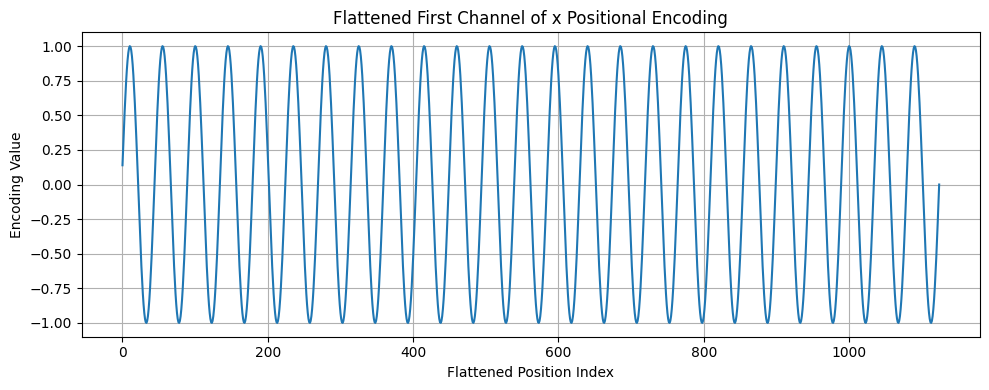

In [ ]:
import matplotlib.pyplot as plt

# Flatten the tensor
flattened_x = first_channel_x.flatten()  # shape: [1125]

# Convert to numpy for plotting
flattened_x_np = flattened_x.cpu().numpy()

# Plot as a line graph
plt.figure(figsize=(10, 4))
plt.plot(flattened_x_np)
plt.title("Flattened First Channel of x Positional Encoding")
plt.xlabel("Flattened Position Index")
plt.ylabel("Encoding Value")
plt.grid(True)
plt.tight_layout()
plt.show()


4 channels positional embedding flatten 5 x 10 sample

In [ ]:
import torch
import torch.nn as nn
import math

# Positional Embedding class (DETR-style)
class PositionEmbeddingSine(nn.Module):
    def __init__(self, num_pos_feats=2, temperature=10000, normalize=True, scale=2*math.pi):
        super().__init__()
        self.num_pos_feats = num_pos_feats
        self.temperature = temperature
        self.normalize = normalize
        self.scale = scale

    def forward(self, x):
        bs, c, h, w = x.shape
        mask = torch.zeros((bs, h, w), dtype=torch.bool, device=x.device)
        not_mask = ~mask
        y_embed = not_mask.cumsum(1, dtype=torch.float32)
        x_embed = not_mask.cumsum(2, dtype=torch.float32)

        if self.normalize:
            eps = 1e-6
            y_embed = y_embed / (y_embed[:, -1:, :] + eps) * self.scale
            x_embed = x_embed / (x_embed[:, :, -1:] + eps) * self.scale

        dim_t = torch.arange(self.num_pos_feats, dtype=torch.float32, device=x.device)
        dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)

        pos_x = x_embed[:, :, :, None] / dim_t
        pos_y = y_embed[:, :, :, None] / dim_t

        pos_x = torch.stack((pos_x[:, :, :, 0::2].sin(), pos_x[:, :, :, 1::2].cos()), dim=4).flatten(3)
        pos_y = torch.stack((pos_y[:, :, :, 0::2].sin(), pos_y[:, :, :, 1::2].cos()), dim=4).flatten(3)

        pos = torch.cat((pos_y, pos_x), dim=3).permute(0, 3, 1, 2)
        return pos


tensor_sample = torch.randn(1, 4, 5, 10)  # [B=1, C=4, H=5, W=10]

dummy_feature_map =  tensor_sample
position_embedding = PositionEmbeddingSine(num_pos_feats=2, normalize=True)

# Compute positional embeddings
pos_embed = position_embedding(dummy_feature_map)
print("Positional Embedding Shape:", pos_embed.shape)
print(pos_embed)
print("-----------------------------------------------------------------------------------------------------")
# Get Y-direction embedding (all 128 channels)
pos_y = pos_embed[0, 0:2, :, :]  # shape: [2, 5, 10]
print("Positional Embedding y:\n", pos_y)
print("----------------------------------------------------------------------------------------------------")
# Get X-direction embedding (all 128 channels)
pos_x = pos_embed[0, 2:4, :, :]  # shape: [2, 5, 10]
print("Positional Embedding x:\n", pos_x)
print("---------------------------------------------------------------------------------------------------")

Positional Embedding Shape: torch.Size([1, 4, 5, 10])
tensor([[[[ 9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,
            9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01,  9.5106e-01],
          [ 5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,
            5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01,  5.8779e-01],
          [-5.8778e-01, -5.8778e-01, -5.8778e-01, -5.8778e-01, -5.8778e-01,
           -5.8778e-01, -5.8778e-01, -5.8778e-01, -5.8778e-01, -5.8778e-01],
          [-9.5106e-01, -9.5106e-01, -9.5106e-01, -9.5106e-01, -9.5106e-01,
           -9.5106e-01, -9.5106e-01, -9.5106e-01, -9.5106e-01, -9.5106e-01],
          [-7.7883e-07, -7.7883e-07, -7.7883e-07, -7.7883e-07, -7.7883e-07,
           -7.7883e-07, -7.7883e-07, -7.7883e-07, -7.7883e-07, -7.7883e-07]],

         [[ 3.0902e-01,  3.0902e-01,  3.0902e-01,  3.0902e-01,  3.0902e-01,
            3.0902e-01,  3.0902e-01,  3.0902e-01,  3.0902e-01,  3.0902e-01],
          [-8.0902e-01, -8

In [ ]:
# Flatten spatial dimensions and permute to Transformer-friendly format
# From shape: [B, 4, 5, 10] → [B, 4, 50] → [50, B, 4]
pos_embed_flattened = pos_embed.flatten(2).permute(2, 0, 1)

print("Flattened Positional Embedding Shape:", pos_embed_flattened.shape)
print(pos_embed_flattened)


Flattened Positional Embedding Shape: torch.Size([50, 1, 4])
tensor([[[ 9.5106e-01,  3.0902e-01,  5.8779e-01,  8.0902e-01]],

        [[ 9.5106e-01,  3.0902e-01,  9.5106e-01,  3.0902e-01]],

        [[ 9.5106e-01,  3.0902e-01,  9.5106e-01, -3.0902e-01]],

        [[ 9.5106e-01,  3.0902e-01,  5.8779e-01, -8.0902e-01]],

        [[ 9.5106e-01,  3.0902e-01,  3.8941e-07, -1.0000e+00]],

        [[ 9.5106e-01,  3.0902e-01, -5.8779e-01, -8.0902e-01]],

        [[ 9.5106e-01,  3.0902e-01, -9.5106e-01, -3.0902e-01]],

        [[ 9.5106e-01,  3.0902e-01, -9.5106e-01,  3.0902e-01]],

        [[ 9.5106e-01,  3.0902e-01, -5.8779e-01,  8.0902e-01]],

        [[ 9.5106e-01,  3.0902e-01, -7.7883e-07,  1.0000e+00]],

        [[ 5.8779e-01, -8.0902e-01,  5.8779e-01,  8.0902e-01]],

        [[ 5.8779e-01, -8.0902e-01,  9.5106e-01,  3.0902e-01]],

        [[ 5.8779e-01, -8.0902e-01,  9.5106e-01, -3.0902e-01]],

        [[ 5.8779e-01, -8.0902e-01,  5.8779e-01, -8.0902e-01]],

        [[ 5.8779e-01, -8.090

flatten pos - pos_embed = pos_embed.flatten(2).permute(2, 0, 1)

In [ ]:
import torch
import torch.nn as nn
import math

# Positional Embedding class (DETR-style)
class PositionEmbeddingSine(nn.Module):
    def __init__(self, num_pos_feats=128, temperature=10000, normalize=True, scale=2*math.pi):
        super().__init__()
        self.num_pos_feats = num_pos_feats
        self.temperature = temperature
        self.normalize = normalize
        self.scale = scale

    def forward(self, x):
        bs, c, h, w = x.shape
        mask = torch.zeros((bs, h, w), dtype=torch.bool, device=x.device)
        not_mask = ~mask
        y_embed = not_mask.cumsum(1, dtype=torch.float32)
        x_embed = not_mask.cumsum(2, dtype=torch.float32)

        if self.normalize:
            eps = 1e-6
            y_embed = y_embed / (y_embed[:, -1:, :] + eps) * self.scale
            x_embed = x_embed / (x_embed[:, :, -1:] + eps) * self.scale

        dim_t = torch.arange(self.num_pos_feats, dtype=torch.float32, device=x.device)
        dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)

        pos_x = x_embed[:, :, :, None] / dim_t
        pos_y = y_embed[:, :, :, None] / dim_t

        pos_x = torch.stack((pos_x[:, :, :, 0::2].sin(), pos_x[:, :, :, 1::2].cos()), dim=4).flatten(3)
        pos_y = torch.stack((pos_y[:, :, :, 0::2].sin(), pos_y[:, :, :, 1::2].cos()), dim=4).flatten(3)

        pos = torch.cat((pos_y, pos_x), dim=3).permute(0, 3, 1, 2)
        return pos

# Use dummy feature map of shape [1, 256, 25, 45]

dummy_feature_map =  torch.randn(1, 256, 25, 45)
position_embedding = PositionEmbeddingSine(num_pos_feats=128, normalize=True)

# Compute positional embeddings
pos_embed = position_embedding(dummy_feature_map)
print("Positional Embedding Shape:", pos_embed.shape)
print(pos_embed)
print("-----------------------------------------------------------------------------------------------------")
# Get Y-direction embedding (all 128 channels)
pos_y = pos_embed[0, 0:128, :, :]  # shape: [128, 25, 45]
print("Positional Embedding y:\n", pos_y)
print("----------------------------------------------------------------------------------------------------")
# Get X-direction embedding (all 128 channels)
pos_x = pos_embed[0, 128:256, :, :]  # shape: [128, 25, 45]
print("Positional Embedding x:\n", pos_x)
print("---------------------------------------------------------------------------------------------------")

Positional Embedding Shape: torch.Size([1, 256, 25, 45])
tensor([[[[ 2.4869e-01,  2.4869e-01,  2.4869e-01,  ...,  2.4869e-01,
            2.4869e-01,  2.4869e-01],
          [ 4.8175e-01,  4.8175e-01,  4.8175e-01,  ...,  4.8175e-01,
            4.8175e-01,  4.8175e-01],
          [ 6.8455e-01,  6.8455e-01,  6.8455e-01,  ...,  6.8455e-01,
            6.8455e-01,  6.8455e-01],
          ...,
          [-4.8175e-01, -4.8175e-01, -4.8175e-01,  ..., -4.8175e-01,
           -4.8175e-01, -4.8175e-01],
          [-2.4869e-01, -2.4869e-01, -2.4869e-01,  ..., -2.4869e-01,
           -2.4869e-01, -2.4869e-01],
          [-3.0199e-07, -3.0199e-07, -3.0199e-07,  ..., -3.0199e-07,
           -3.0199e-07, -3.0199e-07]],

         [[ 9.6858e-01,  9.6858e-01,  9.6858e-01,  ...,  9.6858e-01,
            9.6858e-01,  9.6858e-01],
          [ 8.7631e-01,  8.7631e-01,  8.7631e-01,  ...,  8.7631e-01,
            8.7631e-01,  8.7631e-01],
          [ 7.2897e-01,  7.2897e-01,  7.2897e-01,  ...,  7.2897e-01,
 

In [ ]:
# Now flatten and permute for Transformer input format
# Input: [1, 256, 25, 45] → Flatten → [1, 256, 1125] → Permute → [1125, 1, 256]
pos_embed_flattened = pos_embed.flatten(2).permute(2, 0, 1)
print("Flattened Positional Embedding Shape:", pos_embed_flattened.shape)


Flattened Positional Embedding Shape: torch.Size([1125, 1, 256])


In [ ]:
print("Flattened Positional Embedding Tensor:\n", pos_embed_flattened)

Flattened Positional Embedding Tensor:
 tensor([[[ 2.4869e-01,  9.6858e-01,  2.1593e-01,  ...,  1.0000e+00,
           1.6124e-05,  1.0000e+00]],

        [[ 2.4869e-01,  9.6858e-01,  2.1593e-01,  ...,  1.0000e+00,
           3.2248e-05,  1.0000e+00]],

        [[ 2.4869e-01,  9.6858e-01,  2.1593e-01,  ...,  1.0000e+00,
           4.8371e-05,  1.0000e+00]],

        ...,

        [[-3.0199e-07,  1.0000e+00, -7.4609e-01,  ...,  1.0000e+00,
           6.9332e-04,  1.0000e+00]],

        [[-3.0199e-07,  1.0000e+00, -7.4609e-01,  ...,  1.0000e+00,
           7.0945e-04,  1.0000e+00]],

        [[-3.0199e-07,  1.0000e+00, -7.4609e-01,  ...,  1.0000e+00,
           7.2557e-04,  1.0000e+00]]])


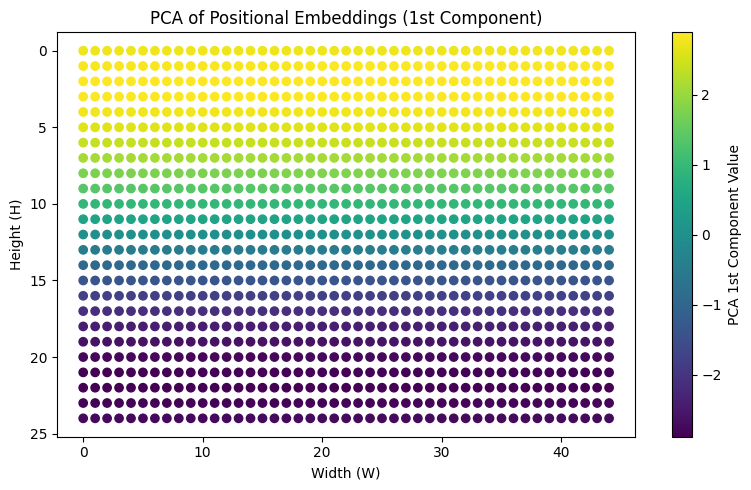

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reshape to [1125, 256] and apply PCA to reduce to 2D
pos_embed_2d = pos_embed_flattened.squeeze(1).cpu().numpy()  # [1125, 256]
pca = PCA(n_components=2)
pos_embed_2d_pca = pca.fit_transform(pos_embed_2d)

# Recreate 2D spatial coordinates (25, 45)
coords = [(i, j) for i in range(25) for j in range(45)]
x_coords, y_coords = zip(*coords)

# Plot PCA projection over actual spatial coordinates
plt.figure(figsize=(8, 5))
plt.scatter(y_coords, x_coords, c=pos_embed_2d_pca[:, 0], cmap='viridis')
plt.gca().invert_yaxis()
plt.title("PCA of Positional Embeddings (1st Component)")
plt.xlabel("Width (W)")
plt.ylabel("Height (H)")
plt.colorbar(label="PCA 1st Component Value")
plt.tight_layout()
plt.show()


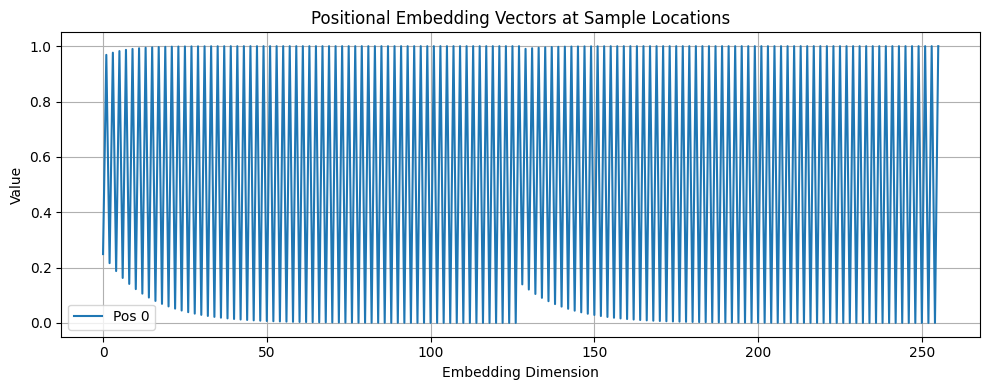

In [ ]:
# Sample positions: top-left, center, bottom-right
indices = [0]  # (0,0), (12,22), (24,44)
plt.figure(figsize=(10, 4))

for idx in indices:
    plt.plot(pos_embed_flattened[idx].squeeze().cpu().numpy(), label=f'Pos {idx}')

plt.title("Positional Embedding Vectors at Sample Locations")
plt.xlabel("Embedding Dimension")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


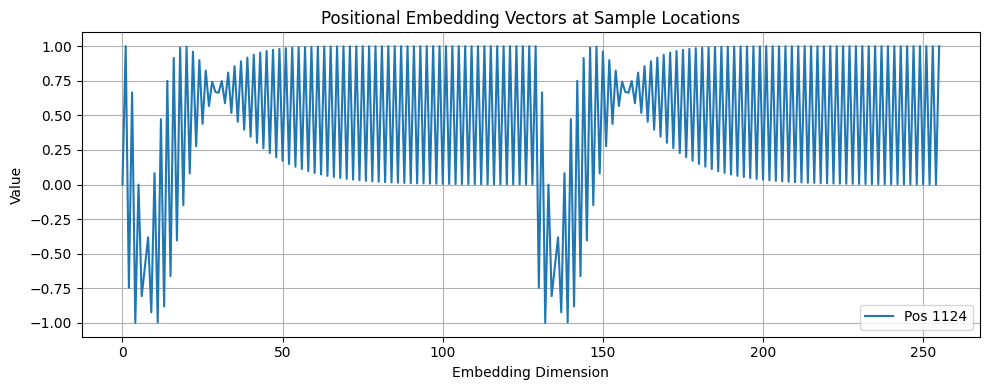

In [ ]:
# Sample positions: top-left, center, bottom-right
indices = [1124]
plt.figure(figsize=(10, 4))

for idx in indices:
    plt.plot(pos_embed_flattened[idx].squeeze().cpu().numpy(), label=f'Pos {idx}')

plt.title("Positional Embedding Vectors at Sample Locations")
plt.xlabel("Embedding Dimension")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


convolution output / input_proj output

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image

from google.colab import drive
from IPython.display import display




In [ ]:
#  Mount Google Drive
drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# 1. Load image
img_path = '/content/drive/MyDrive/peddet_2_1.jpg'
img = Image.open(img_path).convert('RGB')


In [ ]:
import torch
from torchvision.transforms import Compose, ToTensor, Normalize, Resize
from PIL import Image


# 2. Define preprocessing transform (same as DETR)
transform = Compose([
    Resize(800),
    ToTensor(),
    Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
img_tensor = transform(img).unsqueeze(0)  # Shape: [1, 3, H, W]

# 3. Load DETR model
model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
model.eval()

# 4. Hook to capture input_proj output
input_proj_output = None

def hook_fn(module, input, output):
    global input_proj_output
    input_proj_output = output.detach().clone()

hook_handle = model.input_proj.register_forward_hook(hook_fn)

# 5. Forward pass
with torch.no_grad():
    outputs = model(img_tensor)

# 6. Remove hook
hook_handle.remove()

# 7. Save captured tensor
save_path = '/content/drive/MyDrive/input_proj_output.pt'
torch.save(input_proj_output, save_path)
print(f"Saved tensor shape: {input_proj_output.shape}, dtype: {input_proj_output.dtype}")


Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Saved tensor shape: torch.Size([1, 256, 25, 45]), dtype: torch.float32


In [ ]:
input_proj_output = torch.load('/content/drive/MyDrive/input_proj_output.pt')


In [ ]:
import numpy as np

# Convert PyTorch tensor to NumPy array
input_proj_np = input_proj_output.cpu().numpy()

# Save as .npy
np.save('/content/drive/MyDrive/input_proj_output.npy', input_proj_np)


Shape: (1, 256, 25, 45)
Dtype: float32


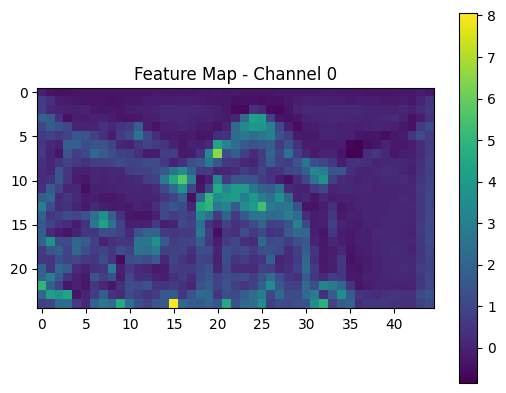

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Load the array
input_proj_np = np.load('/content/drive/MyDrive/input_proj_output.npy')

# Print basic info
print("Shape:", input_proj_np.shape)   # Expected: (1, 256, H, W) e.g., (1, 256, 25, 45)
print("Dtype:", input_proj_np.dtype)

# View a single feature map (e.g., first channel)
channel_idx = 0  # Change this to view other channels (0–255)
feature_map = input_proj_np[0, channel_idx]

# Plot it
plt.imshow(feature_map, cmap='viridis')
plt.title(f"Feature Map - Channel {channel_idx}")
plt.colorbar()
plt.show()


save conv output to a csv file

In [ ]:
#already saved
import torch
import numpy as np
import pandas as pd
import os

# Convert to numpy
input_proj_np = input_proj_output.squeeze(0).cpu().numpy()  # shape: [256, 25, 45]

# Create directory to save CSVs
os.makedirs('/content/drive/MyDrive/feature_maps', exist_ok=True)

# Save each channel
for i in range(input_proj_np.shape[0]):
    df = pd.DataFrame(input_proj_np[i])  # shape: [25, 45]
    csv_path = f'/content/drive/MyDrive/feature_maps/channel_{i}.csv'
    df.to_csv(csv_path, index=False, header=False)

print("Saved all channels as individual CSV files.")


Saved all channels as individual CSV files.


In [ ]:
trans_input = input_proj_output.flatten(2).permute(2, 0, 1)

In [ ]:

print("trans_input shape:", trans_input.shape)


trans_input shape: torch.Size([1125, 1, 256])


In [ ]:

print(trans_input)

tensor([[[-0.0811,  0.1507,  0.3771,  ...,  0.1229,  0.1999, -0.2595]],

        [[-0.3752, -0.0324,  0.1213,  ...,  0.3738, -0.3401,  0.3292]],

        [[-0.4590,  0.0367,  0.0960,  ...,  0.2164, -0.1534,  0.2898]],

        ...,

        [[ 0.3558,  0.2100,  0.8655,  ...,  0.2736, -0.5163, -0.5841]],

        [[ 0.8449,  0.1120,  0.8852,  ..., -0.0561, -1.1270, -0.3020]],

        [[ 1.0754,  0.0745,  0.1408,  ..., -0.3629,  0.0586, -0.8159]]])


In [ ]:
import torch
import torch.nn as nn
import math

# Positional Embedding class (DETR-style)
class PositionEmbeddingSine(nn.Module):
    def __init__(self, num_pos_feats=128, temperature=10000, normalize=True, scale=2*math.pi):
        super().__init__()
        self.num_pos_feats = num_pos_feats
        self.temperature = temperature
        self.normalize = normalize
        self.scale = scale

    def forward(self, x):
        bs, c, h, w = x.shape
        mask = torch.zeros((bs, h, w), dtype=torch.bool, device=x.device)
        not_mask = ~mask
        y_embed = not_mask.cumsum(1, dtype=torch.float32)
        x_embed = not_mask.cumsum(2, dtype=torch.float32)

        if self.normalize:
            eps = 1e-6
            y_embed = y_embed / (y_embed[:, -1:, :] + eps) * self.scale
            x_embed = x_embed / (x_embed[:, :, -1:] + eps) * self.scale

        dim_t = torch.arange(self.num_pos_feats, dtype=torch.float32, device=x.device)
        dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)

        pos_x = x_embed[:, :, :, None] / dim_t
        pos_y = y_embed[:, :, :, None] / dim_t

        pos_x = torch.stack((pos_x[:, :, :, 0::2].sin(), pos_x[:, :, :, 1::2].cos()), dim=4).flatten(3)
        pos_y = torch.stack((pos_y[:, :, :, 0::2].sin(), pos_y[:, :, :, 1::2].cos()), dim=4).flatten(3)

        pos = torch.cat((pos_y, pos_x), dim=3).permute(0, 3, 1, 2)

        # Save full positional encodings for y and x for i = 0
        pos_y_encoding = pos_y[0].permute(2, 0, 1)  # [H, W, C] -> [C, H, W]
        pos_x_encoding = pos_x[0].permute(2, 0, 1)  # [H, W, C] -> [C, H, W]

        return pos, pos_y_encoding, pos_x_encoding

# Dummy input feature map [B, C, H, W]
dummy_feature_map = torch.randn(1, 256, 25, 45)
position_embedding = PositionEmbeddingSine(num_pos_feats=128, normalize=True)

# Forward pass to get positional encodings and separated x/y encodings
pos_embed, saved_pos_y, saved_pos_x = position_embedding(dummy_feature_map)

# Print outputs
print("Positional Embedding Shape:", pos_embed.shape)  # [1, 256, 25, 45]
print("Positional Embedding \n :", pos_embed)  # [1, 256, 25, 45]

print("--------------------------------------------------------------------------------")

print("Saved Positional Encoding y Shape:", saved_pos_y.shape)  # [128, 25, 45]
print("Saved Positional Encoding x Shape:", saved_pos_x.shape)  # [128, 25, 45]

print("Saved Positional Encoding y:\n", saved_pos_y)
print("--------------------------------------------------------------------------------")
print("Saved Positional Encoding x:\n", saved_pos_x)


Positional Embedding Shape: torch.Size([1, 256, 25, 45])
Positional Embedding 
 : tensor([[[[ 2.4869e-01,  2.4869e-01,  2.4869e-01,  ...,  2.4869e-01,
            2.4869e-01,  2.4869e-01],
          [ 4.8175e-01,  4.8175e-01,  4.8175e-01,  ...,  4.8175e-01,
            4.8175e-01,  4.8175e-01],
          [ 6.8455e-01,  6.8455e-01,  6.8455e-01,  ...,  6.8455e-01,
            6.8455e-01,  6.8455e-01],
          ...,
          [-4.8175e-01, -4.8175e-01, -4.8175e-01,  ..., -4.8175e-01,
           -4.8175e-01, -4.8175e-01],
          [-2.4869e-01, -2.4869e-01, -2.4869e-01,  ..., -2.4869e-01,
           -2.4869e-01, -2.4869e-01],
          [-3.0199e-07, -3.0199e-07, -3.0199e-07,  ..., -3.0199e-07,
           -3.0199e-07, -3.0199e-07]],

         [[ 9.6858e-01,  9.6858e-01,  9.6858e-01,  ...,  9.6858e-01,
            9.6858e-01,  9.6858e-01],
          [ 8.7631e-01,  8.7631e-01,  8.7631e-01,  ...,  8.7631e-01,
            8.7631e-01,  8.7631e-01],
          [ 7.2897e-01,  7.2897e-01,  7.2897e

In [ ]:
trans_pe = pos_embed.flatten(2).permute(2, 0, 1)
print("trans_pe shape:", trans_pe.shape)
print(trans_pe)

trans_pe shape: torch.Size([1125, 1, 256])
tensor([[[ 2.4869e-01,  9.6858e-01,  2.1593e-01,  ...,  1.0000e+00,
           1.6124e-05,  1.0000e+00]],

        [[ 2.4869e-01,  9.6858e-01,  2.1593e-01,  ...,  1.0000e+00,
           3.2248e-05,  1.0000e+00]],

        [[ 2.4869e-01,  9.6858e-01,  2.1593e-01,  ...,  1.0000e+00,
           4.8371e-05,  1.0000e+00]],

        ...,

        [[-3.0199e-07,  1.0000e+00, -7.4609e-01,  ...,  1.0000e+00,
           6.9332e-04,  1.0000e+00]],

        [[-3.0199e-07,  1.0000e+00, -7.4609e-01,  ...,  1.0000e+00,
           7.0945e-04,  1.0000e+00]],

        [[-3.0199e-07,  1.0000e+00, -7.4609e-01,  ...,  1.0000e+00,
           7.2557e-04,  1.0000e+00]]])


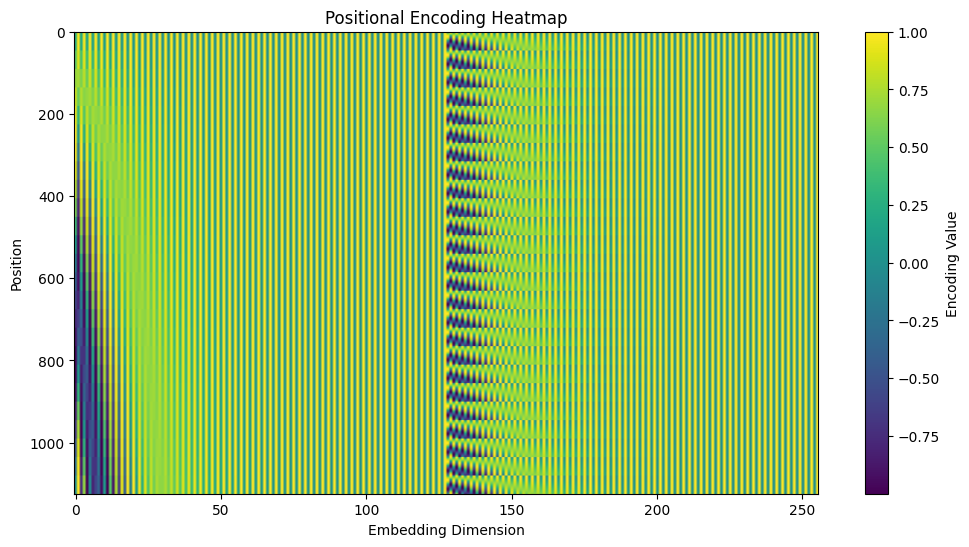

In [ ]:
import torch
import matplotlib.pyplot as plt

# Assume trans_pe is your tensor
trans_pe_1 = trans_pe.squeeze(1)  # Shape becomes (1125, 256)

plt.figure(figsize=(12, 6))
plt.imshow(trans_pe_1.cpu().numpy(), aspect='auto', cmap='viridis')
plt.colorbar(label='Encoding Value')
plt.xlabel('Embedding Dimension')
plt.ylabel('Position')
plt.title('Positional Encoding Heatmap')
plt.show()


In [ ]:
enc_input = trans_input + trans_pe

In [ ]:
print(enc_input.shape)

torch.Size([1125, 1, 256])


In [ ]:
print(enc_input)

tensor([[[ 0.1675,  1.1193,  0.5930,  ...,  1.1229,  0.1999,  0.7405]],

        [[-0.1266,  0.9362,  0.3373,  ...,  1.3738, -0.3401,  1.3292]],

        [[-0.2103,  1.0053,  0.3120,  ...,  1.2164, -0.1534,  1.2898]],

        ...,

        [[ 0.3558,  1.2100,  0.1194,  ...,  1.2736, -0.5156,  0.4159]],

        [[ 0.8449,  1.1120,  0.1391,  ...,  0.9439, -1.1263,  0.6980]],

        [[ 1.0754,  1.0745, -0.6053,  ...,  0.6371,  0.0593,  0.1841]]])


full PE plot